# Выпускная квалификационная работа по курсу "Data Science".
# Тема: Прогнозирование конечных свойств новых материалов (композиционных материалов).

## Предобработка данных.

### Работа с исходными файлами.

In [3]:
# загрузка библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [4]:
#загрузка данных из файла X_bp и просмотр первых 5и строк
data_bp = pd.read_excel('X_bp.xlsx', index_col=0)
data_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [5]:
#просмотр описательной статистики
data_bp.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628


In [6]:
#загрузка данных из файла X_nup
data_nup = pd.read_excel('X_nup.xlsx', index_col=0)
data_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [7]:
#просмотр описательной статистики
data_nup.describe()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1040.00000,1040.000000,1040.000000
mean,45.00000,6.911385,57.248399
std,45.02165,2.555181,12.332438
min,0.00000,0.000000,0.000000
25%,0.00000,5.102256,49.970740
50%,45.00000,6.938000,57.413594
75%,90.00000,8.587662,65.107235
max,90.00000,14.440522,103.988901


**_Заметим: количество строк в файлах разное, однако требуется объединить датасеты по принципу INNER, то есть число строк, которое должно остаться - 1023._**

In [8]:
#объединение и проверка размерности
data = data_bp.merge (data_nup, how = 'inner', left_index= True, right_index=True)
data.shape

(1023, 13)

In [9]:
# просмотр первых пяти строк
data.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [10]:
# просмотр последних пяти строк
data.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,90,6.078902,77.434468


In [11]:
#просмотр описательной статистики
data.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [12]:
# просмотр типа данных в столбцах
data.dtypes

Соотношение матрица-наполнитель         float64
Плотность, кг/м3                        float64
модуль упругости, ГПа                   float64
Количество отвердителя, м.%             float64
Содержание эпоксидных групп,%_2         float64
Температура вспышки, С_2                float64
Поверхностная плотность, г/м2           float64
Модуль упругости при растяжении, ГПа    float64
Прочность при растяжении, МПа           float64
Потребление смолы, г/м2                 float64
Угол нашивки, град                        int64
Шаг нашивки                             float64
Плотность нашивки                       float64
dtype: object

In [13]:
 # просмотр количества пропущенных значений в столбцах
data.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [14]:
# выявление дублирующихся строк
data.duplicated(keep=False).sum()

0

In [15]:
#data = pd.get_dummies(data, columns=['Угол нашивки, град'], prefix='', prefix_sep='')

**_При анализе данных получившегося файла, можно сказать следующее:_**
- _пропуски в данных не наблюдаются_
- _дубликаты записей отсутствуют_
- _все значения являются числовыми_
- _показатель "Угол нашивки" принимает только два значения "0" и "90" градусов. При исследовании предметной области выяснилось, что этот параметр может также принимать значения "-45" и "45" градусов. Возникла дилемма: следует ли идентифицировать переменную как категориальную и вводить два дополнительных класса, данными которого мы не располагаем, или не применять кодирование. Было принято решение оставить параметр вещественным, исходя из его физического смысла._
- _странным фактом является наличие целочисленных данных в первых двадцати трех строках датасета, в то время как большинство измерений производится в формате "с плавающей точкой". Можно предположить, часть данных искусственно синтезирована, однако положимся на компетенции составителей датасета._

In [16]:
#сохранение объединенного датасета в файл excel
data.to_excel('df_merged1.xlsx')

In [17]:
#загрузка библиотеки для посмотра альтернативного способа получения аналитики и статистики по переменным
import ydata_profiling

In [18]:
#посмотр альтернативного способа получения аналитики и статистики по переменным
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Визуальное исследование датасета.

**_Построение для каждого из показателей:_**
- _гистограммы для определения плотности вероятности распределения данных_
- _межквартильного размаха для отображения одномерного распределения вероятности, визуализации выбросов._

In [19]:
# загрузка библиотек
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")

In [20]:
#просмотр наименований столбцов
data.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

**_Гистограммы распределения._**

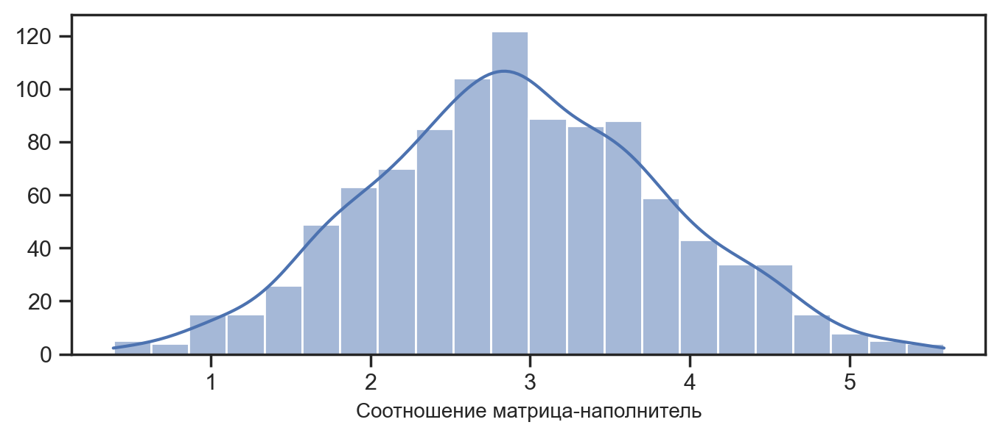

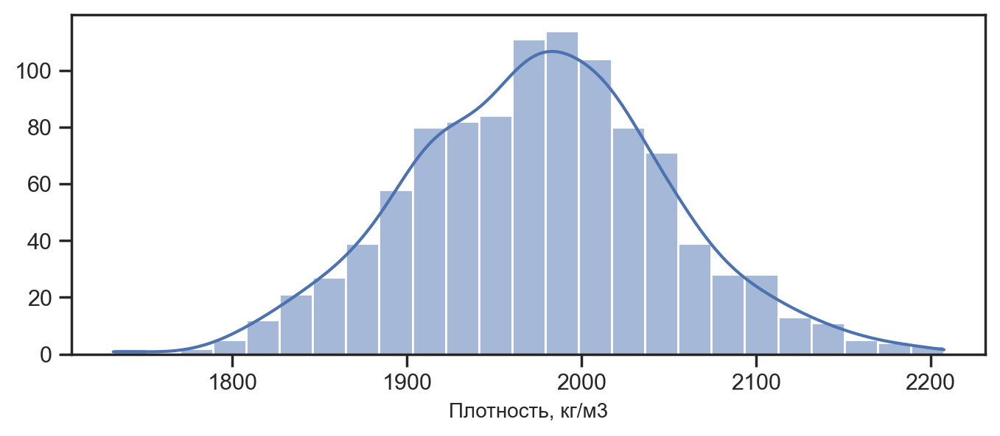

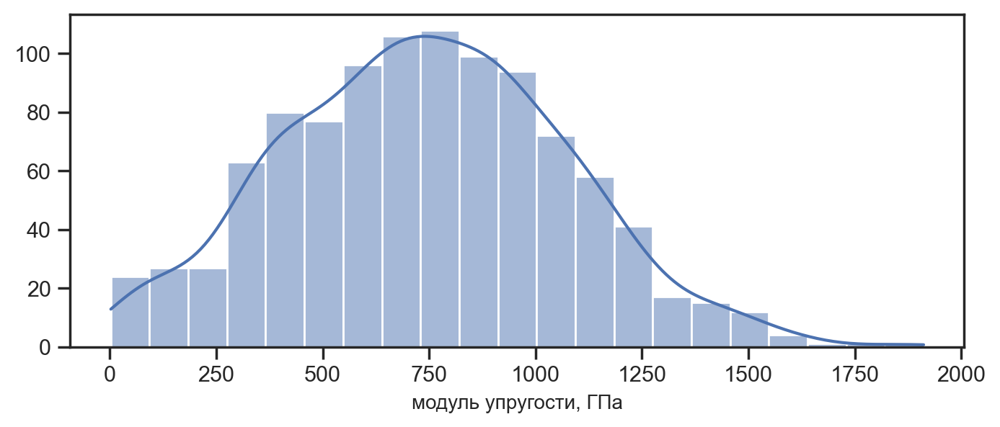

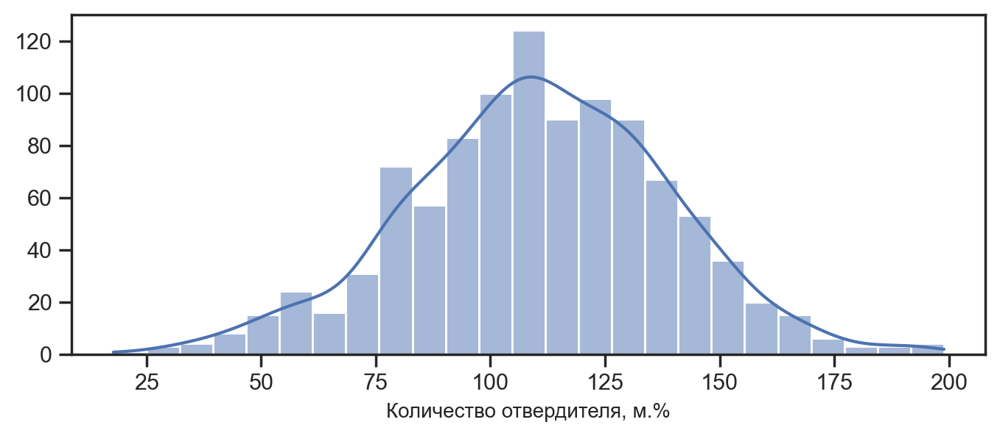

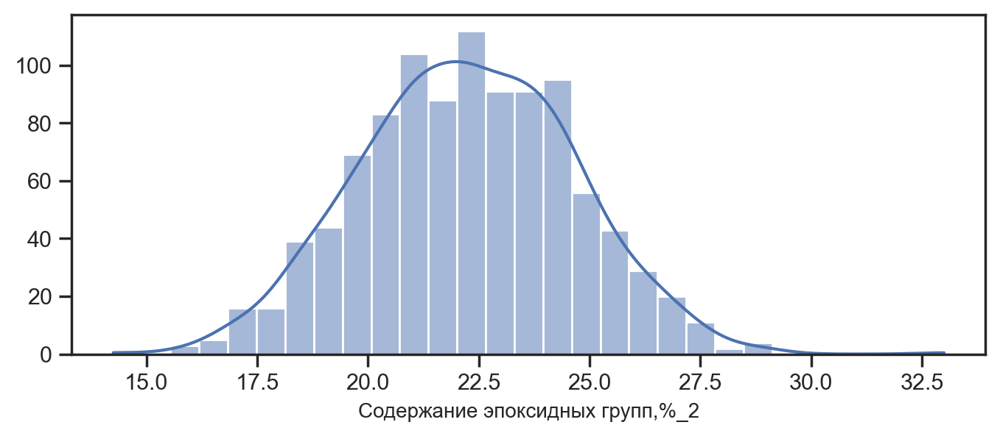

...

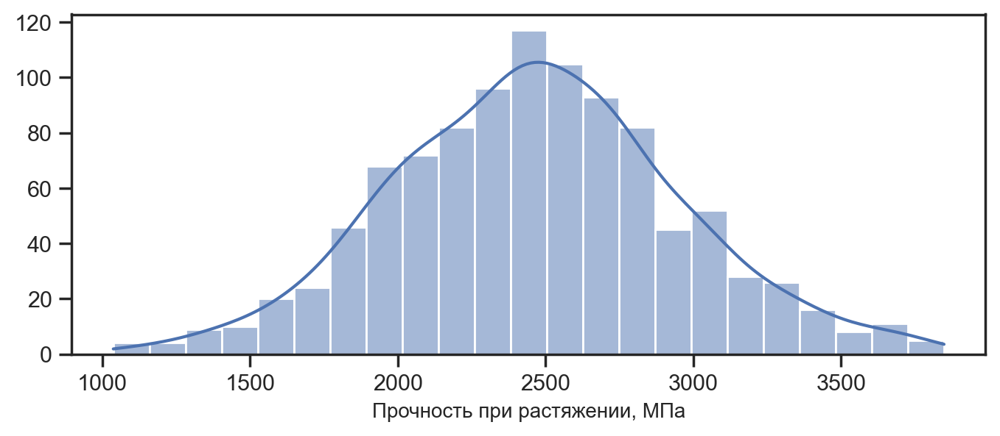

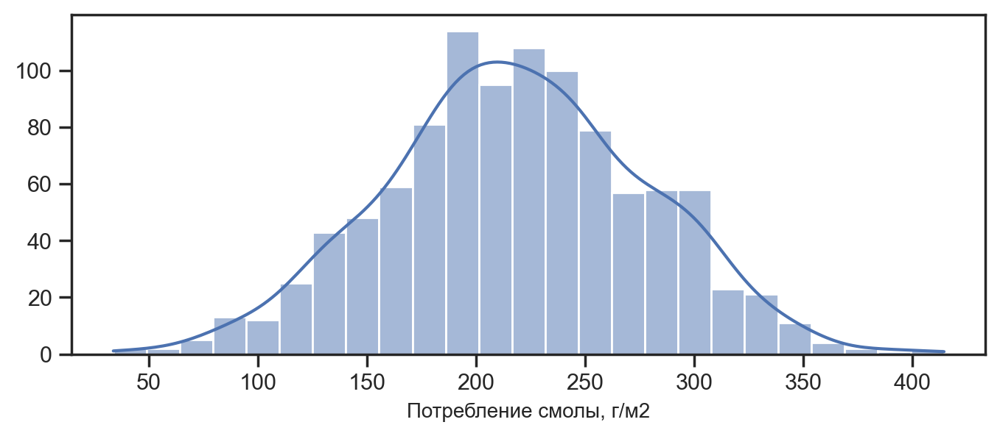

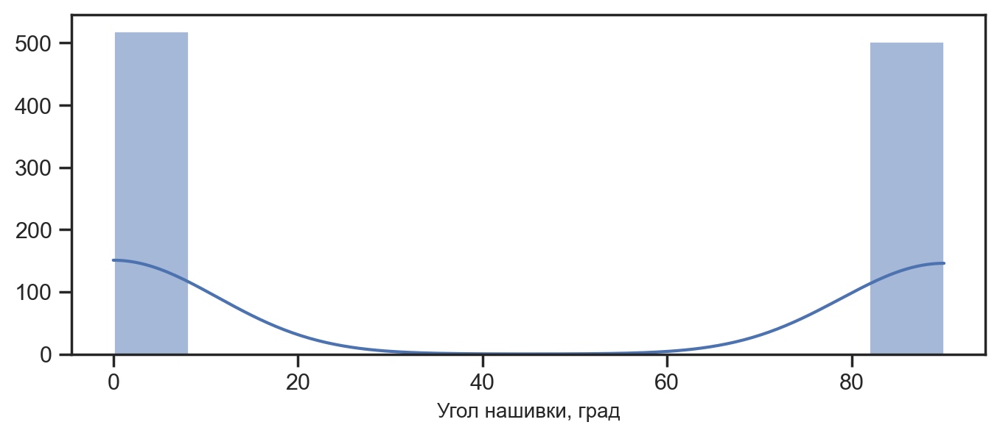

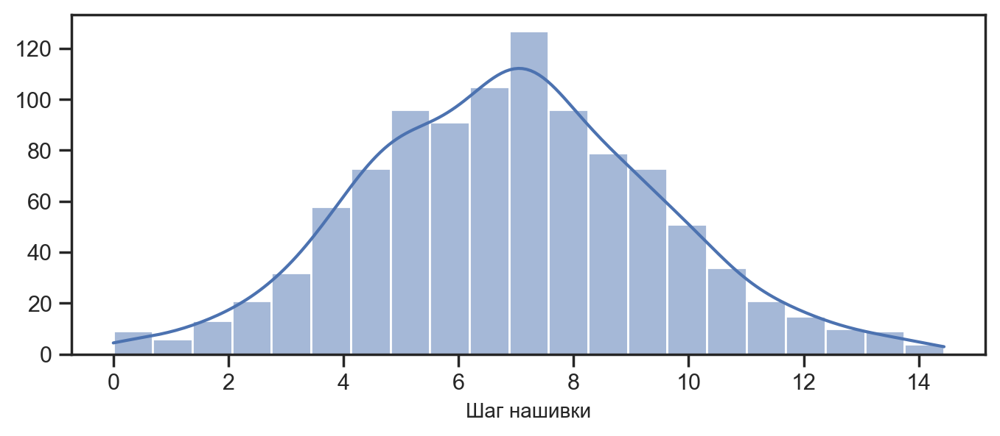

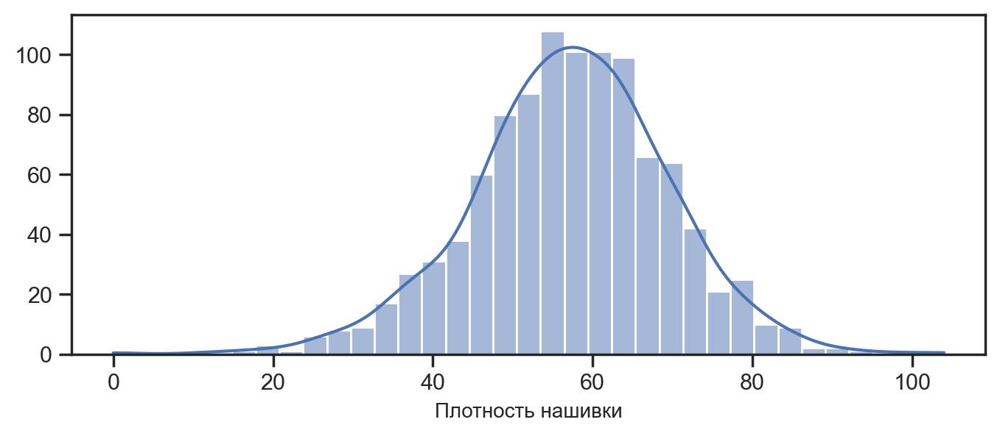

In [21]:
# построение гистограмм для каждого из показателей
for col in data.columns:
    plt.figure (figsize = (8, 3))
    sns.histplot(data = data[col], kde = True) # c указанием плотности случайной величины
    plt.ylabel (None)
    plt.xlabel(col, size = 10)
    plt.show()

_**Аналитика:**  гистограммы на первый взгляд имеют нормальное распределение, однако можно наблюдать смещение. Необходимо рассмотреть межквартильный размах._


_**Межквартильный размах.**_

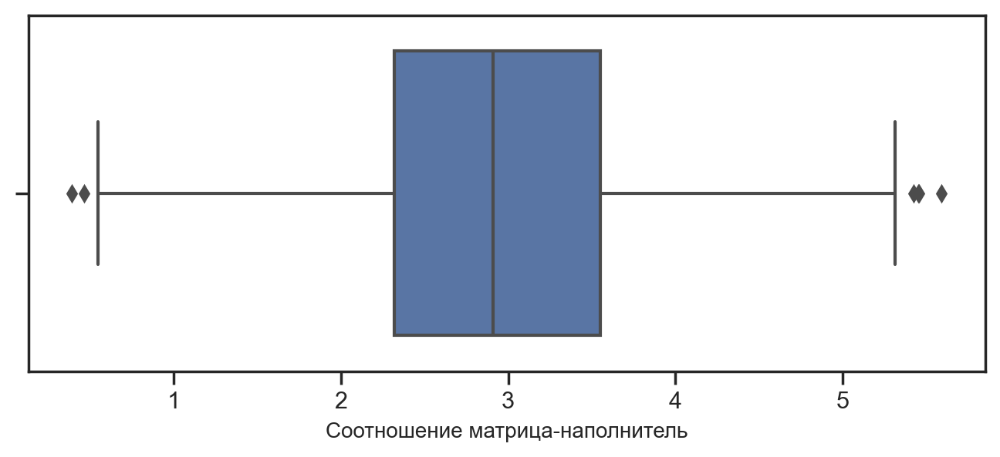

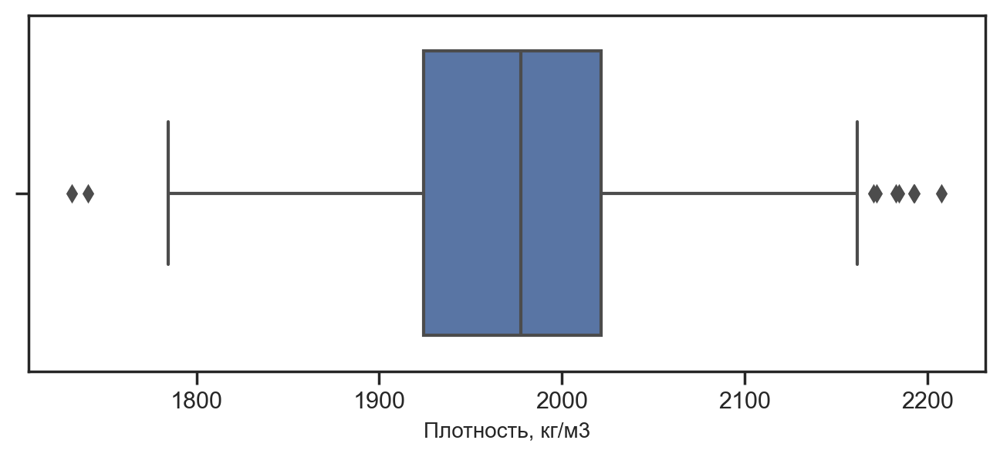

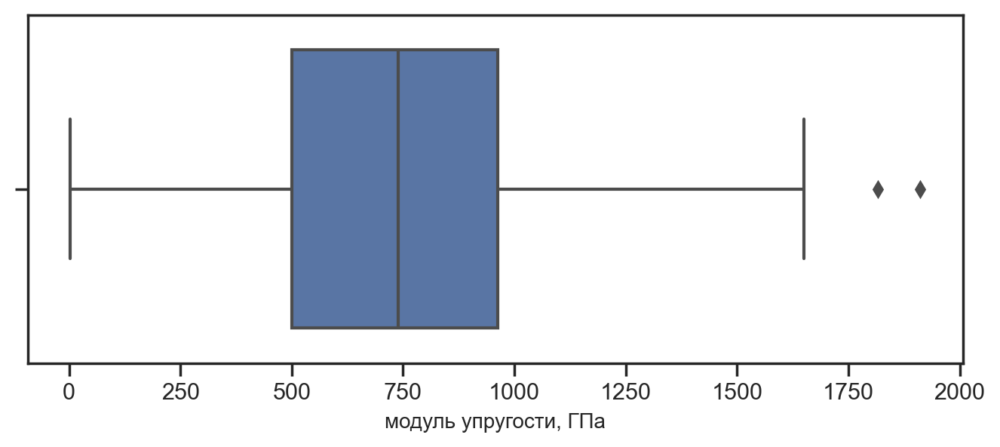

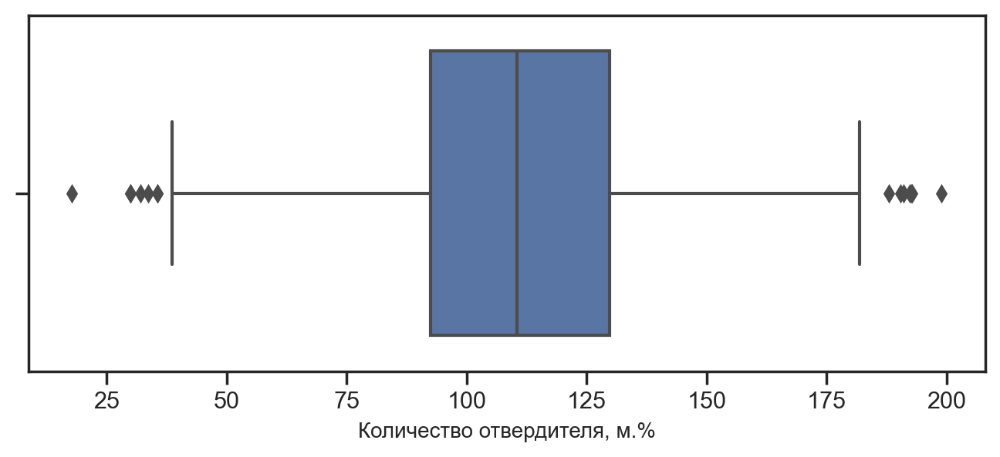

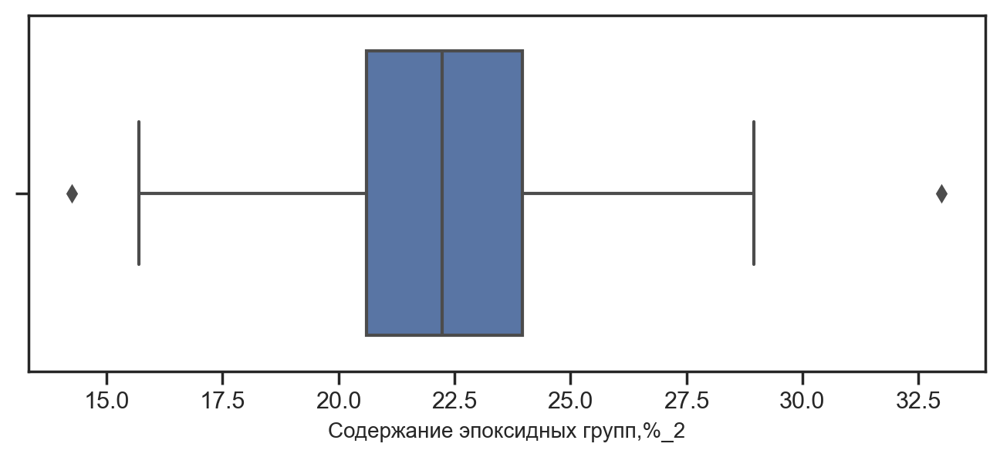

...

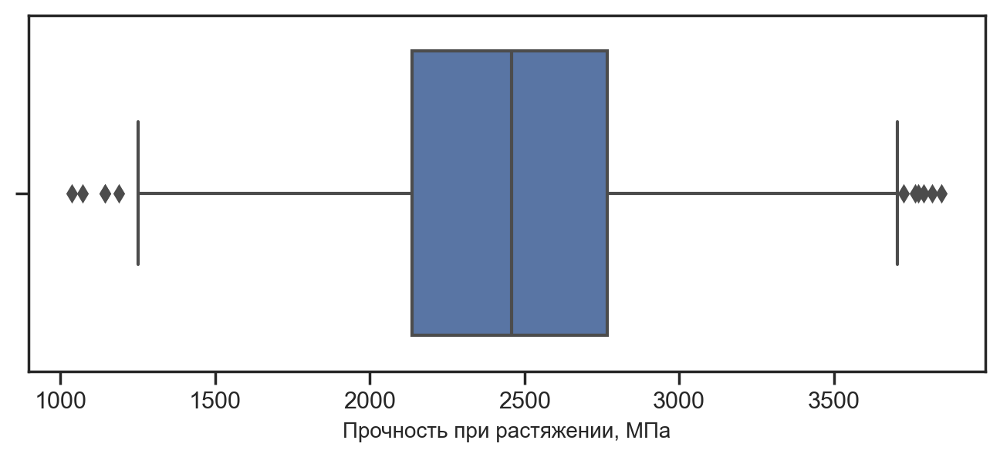

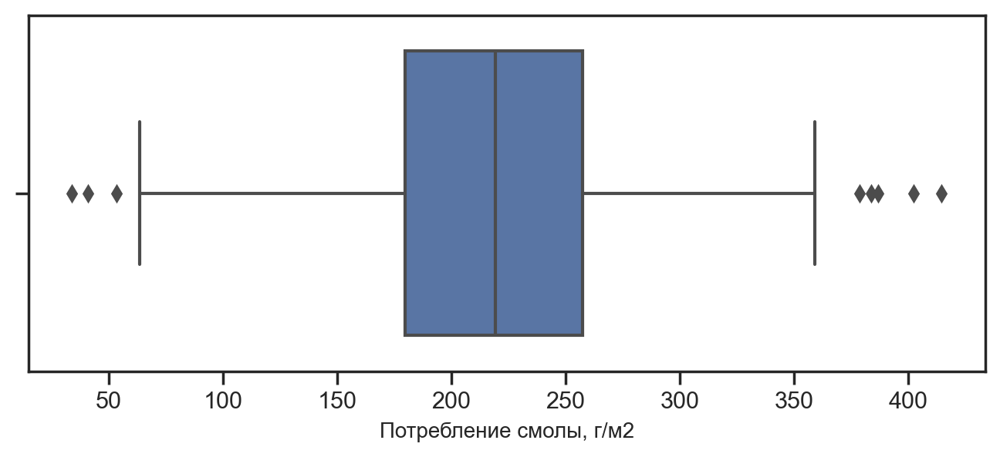

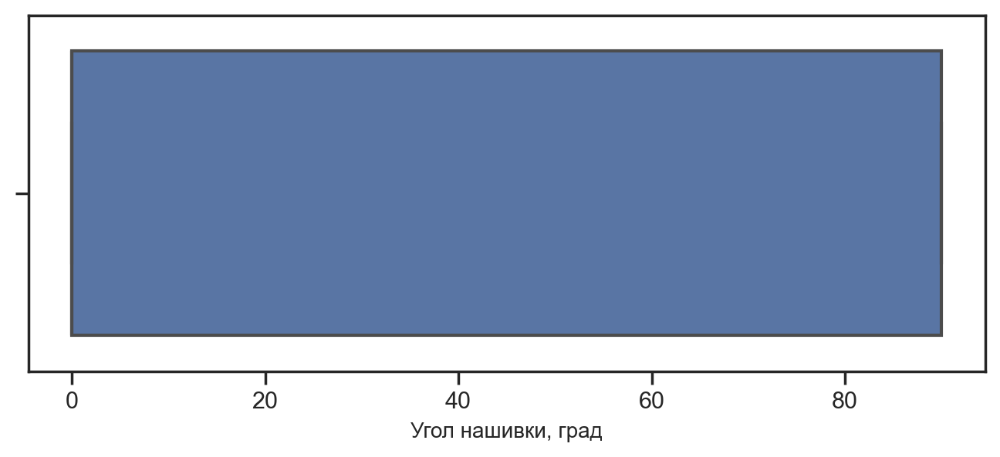

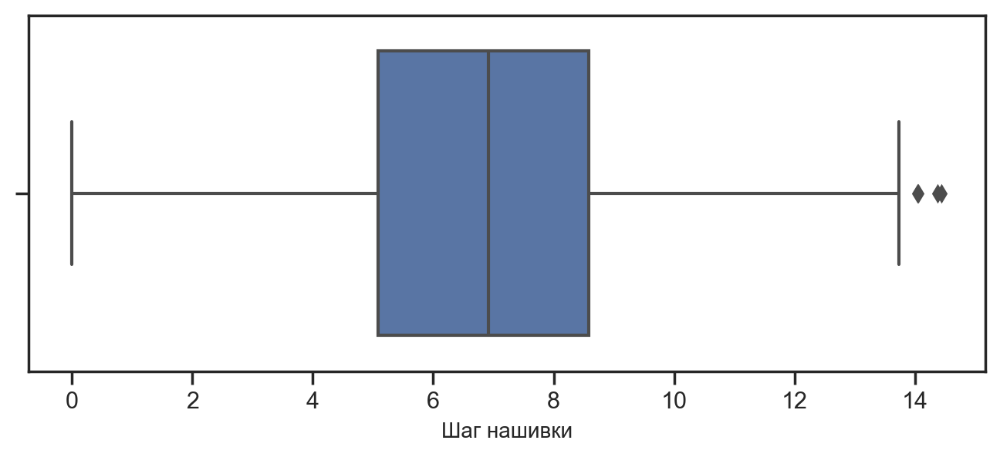

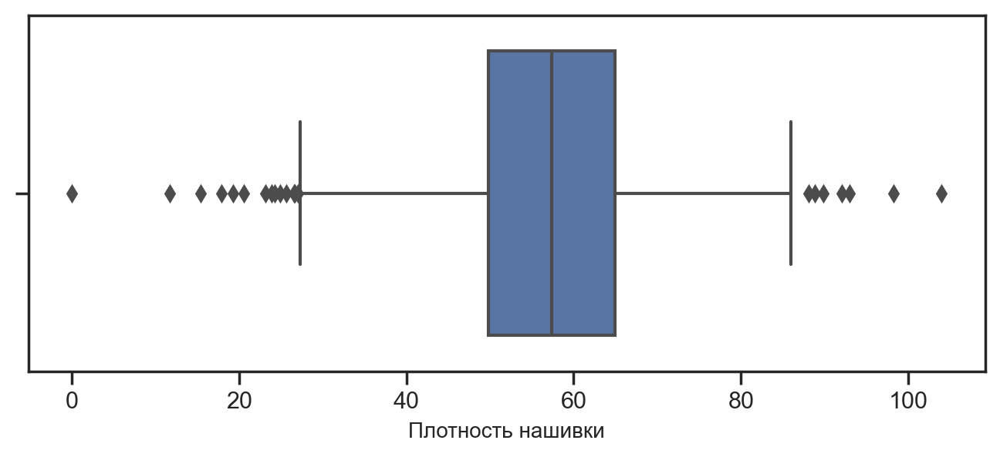

In [22]:
# построение межквартильного размаха для каждого из признаков
for col in data.columns:
    plt.figure (figsize = (8,3))
    sns.boxplot (data = data, x= data[col], color='b')
    plt.xlabel (col, fontsize = 10)

_**Аналитика:** на вышеприведенных графиках можно наблюдать наличие аномальных значений в виде точек за усами графика (значения вне интерквартильного интервала)._

### Анализ выбросов данных, нормализация и корреляционная матрица.

In [23]:
# загрузка библиотеки
import scipy.stats as stats

In [24]:
# анализ стандартизированной оценки (Z- оценки) с выводом числа строк после произведения выбросов
z = np.abs(stats.zscore(data))
df2 = data[(z<3).all(axis=1)]

print ('Размер датасета после удаления выбросов методом Z-оценки', df2.shape)

Размер датасета после удаления выбросов методом Z-оценки (999, 13)


In [25]:
# анализ межквартильного размаха (разброса данных вокруг медианы) с выводом числа строк после произведения выбросов
Q25 = data.quantile (q=.25)
Q75 = data.quantile (q=.75)
IQR = data.apply (stats.iqr)

df = data[~((data < ( Q25-1.5*IQR)) | (data > ( Q75+1.5*IQR))).any(axis=1)]
print ('Размер датасета после удаления выбросов методом межквартильного размаха', df.shape)

Размер датасета после удаления выбросов методом межквартильного размаха (936, 13)


_**Анатитика**: при расчете z-оценки количество выбросов составляет 23 строки, при межквартильном размахе - 86, что эквивалентно ~12% всех данных. Несмотря на то, что это внушительная часть данных, применим отсечение выбросов этим параметром, основываясь на том,что в целом гистограммы распределены нормально, но местами присутствует смещение, что предполагает использование данного метода. Предположительно после исключения выбросов сформируются новые аномалии, однако после первого исключения выбросов удалены ошибки в данных, а дальнейшая очистка может привести к искажению модели._

In [26]:
#сохранение очищенного датасета в файл excel
df.to_excel('df_.xlsx')

**_Проверка очищенных данных на нормальность при применении преобразования Йео-Джонсона:_**
- _построение гистограмм до/после_
- _построение графиков QQ (квантиль-квантиль)_
- _проведение теста на нормальность Шапиро - Уилка_

_Преобразование Йео-Джонсона используется исходя из того, что показатель "Угол нашивки" принят как вещественный с возможными отрицательными и нулевыми значениями, в отличие от преобразования Бокса-Кокса._

In [27]:
# загрузка метода
from sklearn.preprocessing import PowerTransformer

In [28]:
# применение нормализации Йео-Джонсона
yeo = PowerTransformer(method='yeo-johnson', standardize=True) #распределение приведено к стандартному (вычитание среднего и масштабирование дисперсией)
data_norm = pd.DataFrame(yeo.fit_transform(df), columns=df.columns) # нормализование датасета
data_norm.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,-1.201352,0.791085,0.037864,-2.184100,0.647758,-0.032071,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-1.163563,0.216560
1,-1.201352,0.791085,0.037864,0.662999,-0.394297,0.357901,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-0.756537,-0.934116
2,-0.157379,0.791085,0.080442,0.018783,0.031864,-0.032071,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-0.756537,-0.051774
3,-0.161209,0.367681,0.065530,0.018783,0.031864,-0.032071,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-0.756537,0.216560
4,-0.384536,-0.904696,0.240600,0.018783,0.031864,-0.032071,-0.937592,-1.094193,1.141432,0.041602,-1.023787,-0.756537,1.121797


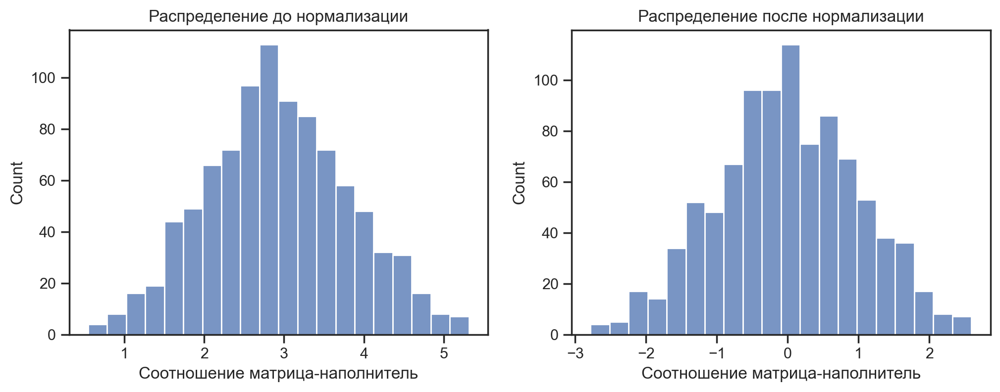

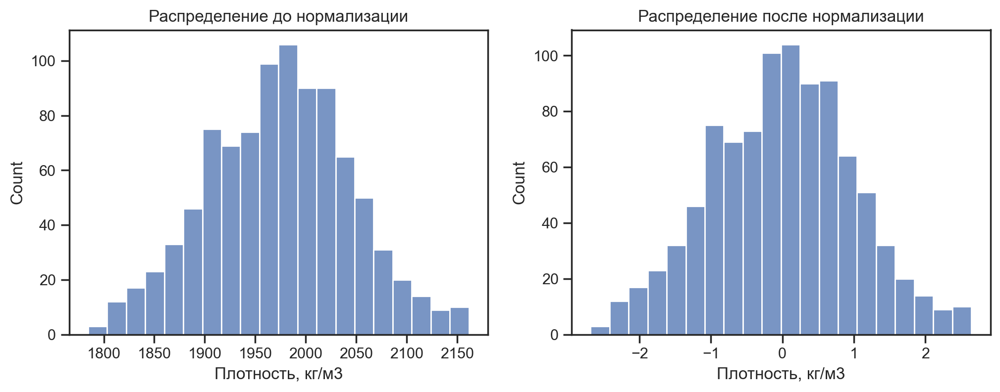

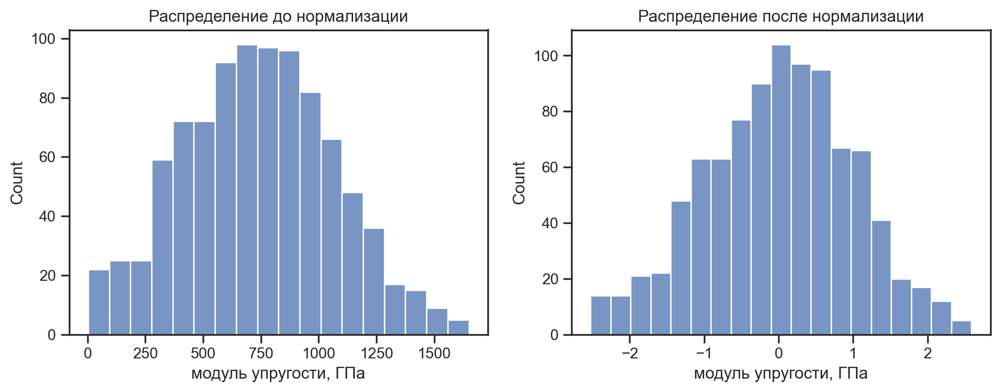

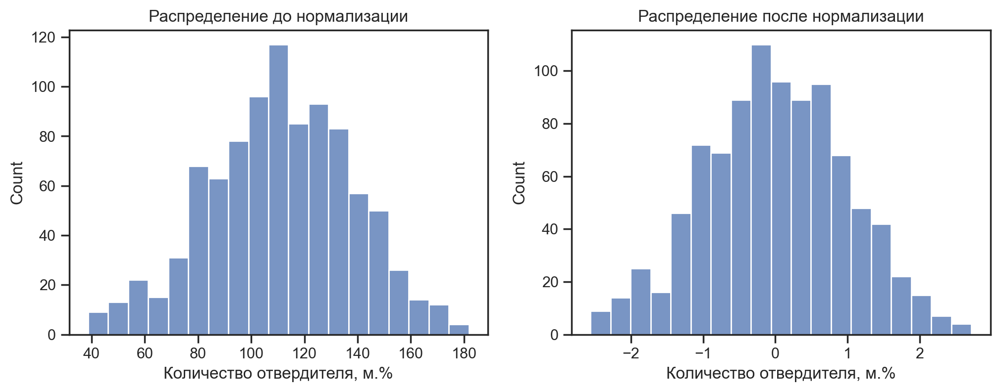

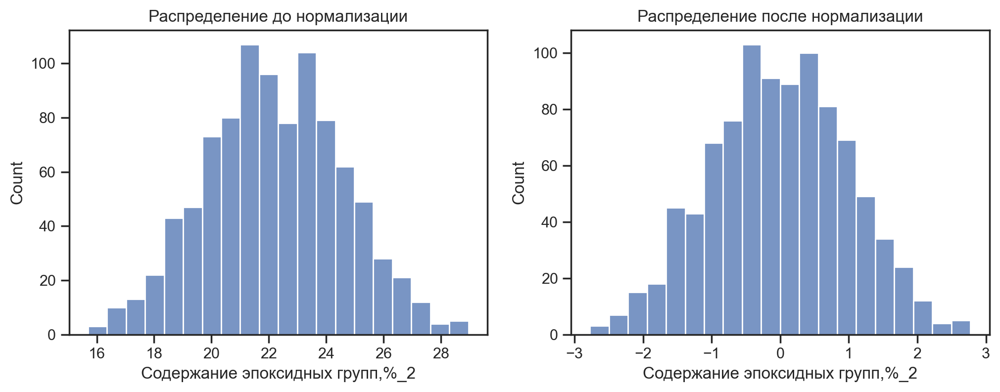

...

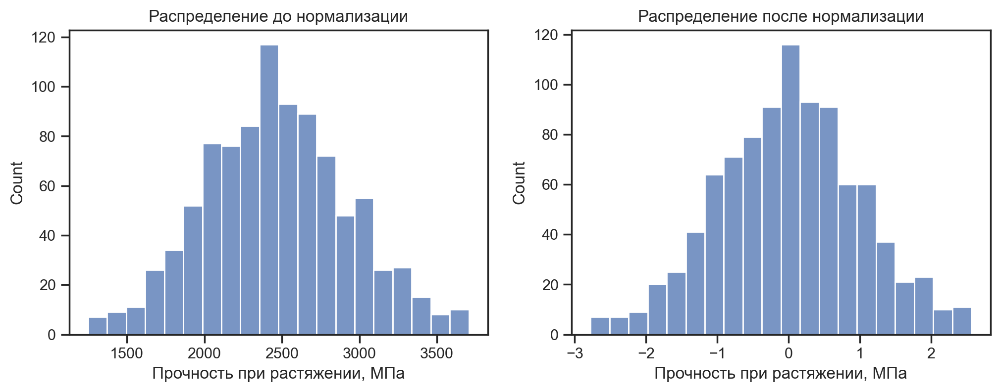

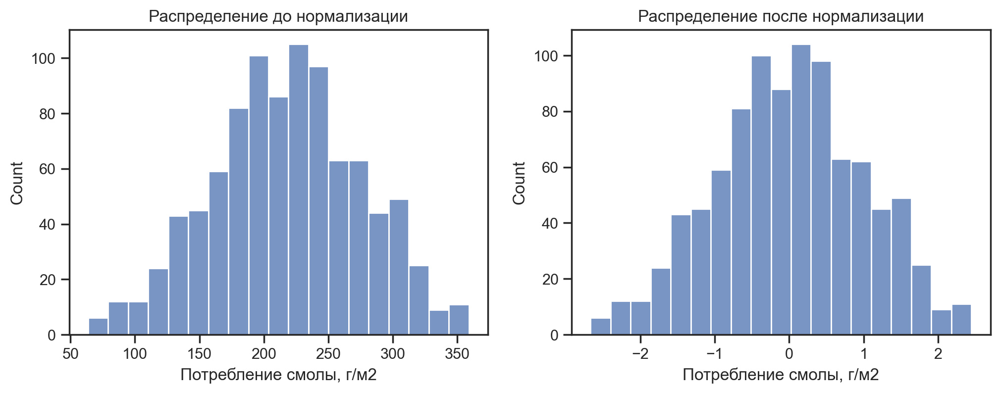

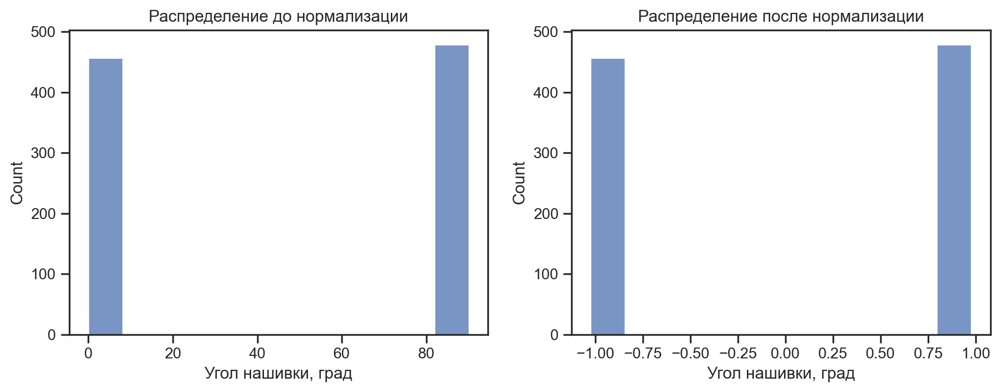

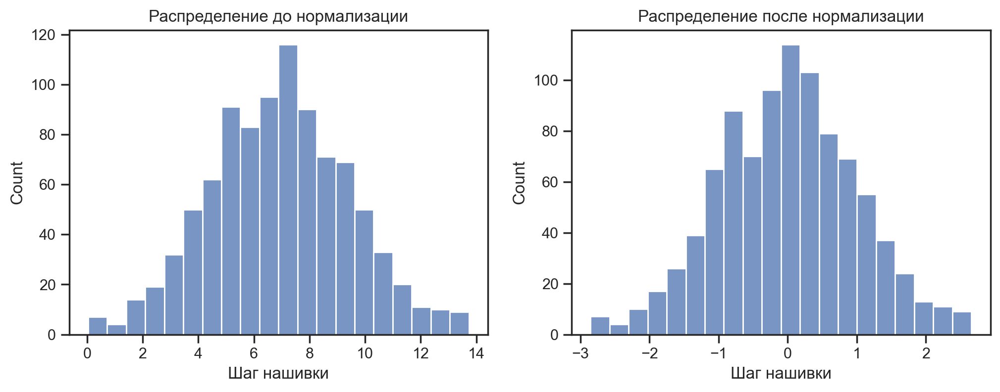

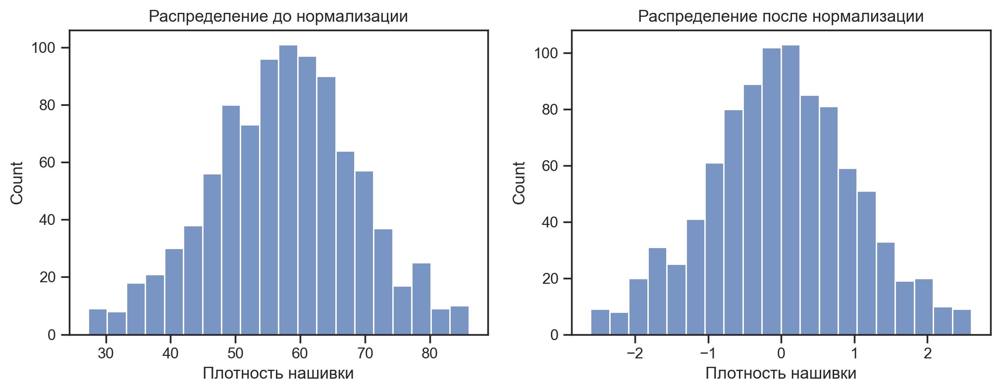

In [29]:
#просмотр распределения по параметрам до и после нормализации
for col in data_norm.columns:
    plt.figure(figsize=(12,4))
    plt.subplot(121)
    sns.histplot(df[col]).set_title('Распределение до нормализации')
    plt.subplot(122)
    sns.histplot(data_norm[col]).set_title('Распределение после нормализации')

**_Построение QQ графиков для каждого из параметров в своих координатах._**

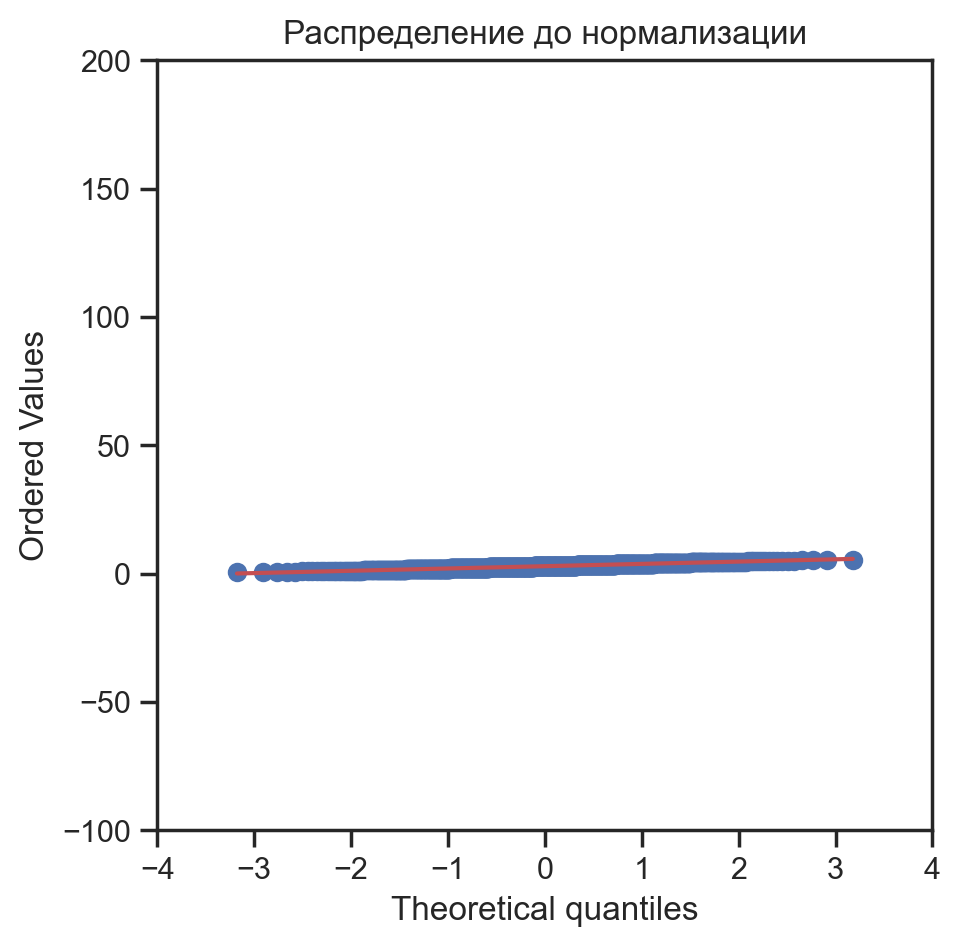

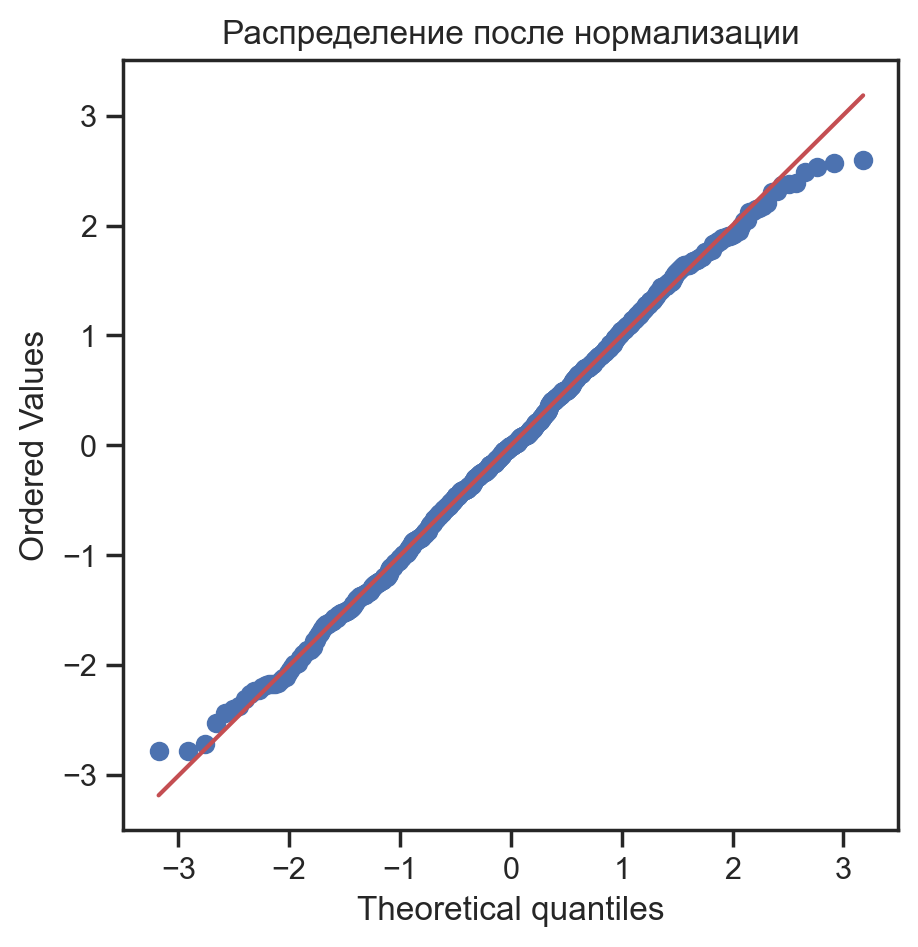

In [30]:
#построение графиков квантиль -квантиль (наблюдение - теория)
plt.figure(figsize=(5,5))
stats.probplot(df['Соотношение матрица-наполнитель'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, -100, 200]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Соотношение матрица-наполнитель'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

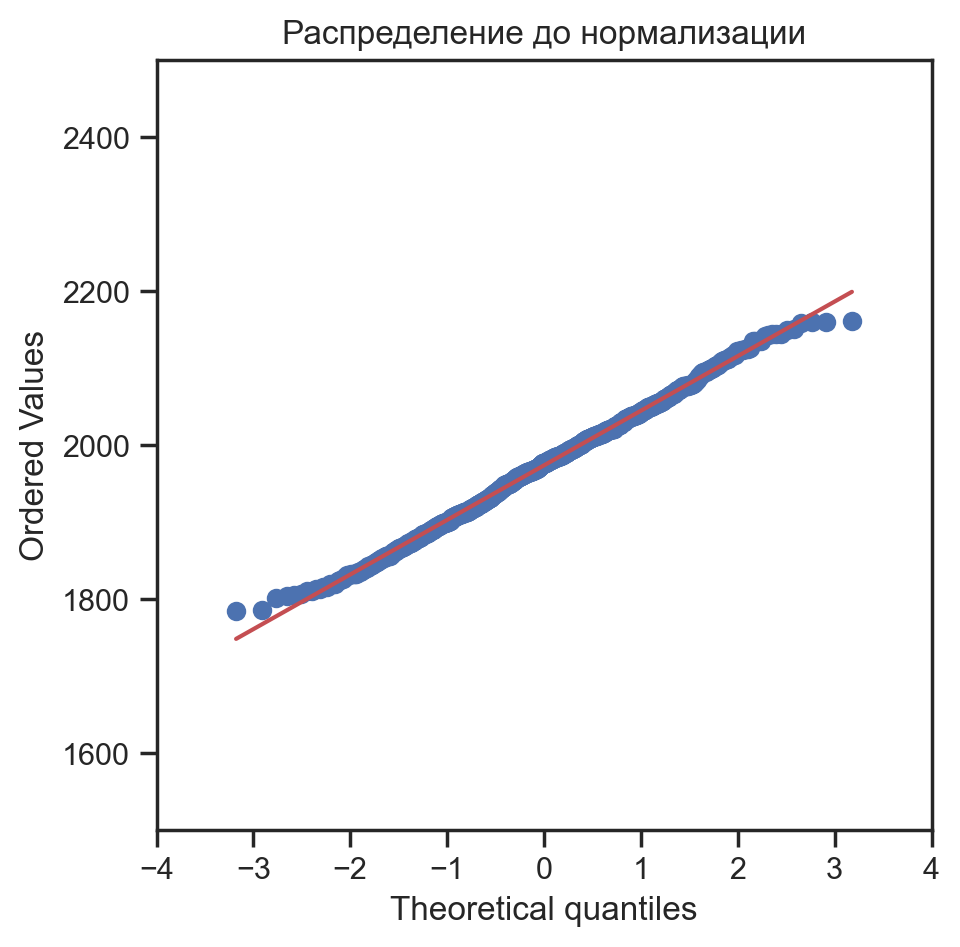

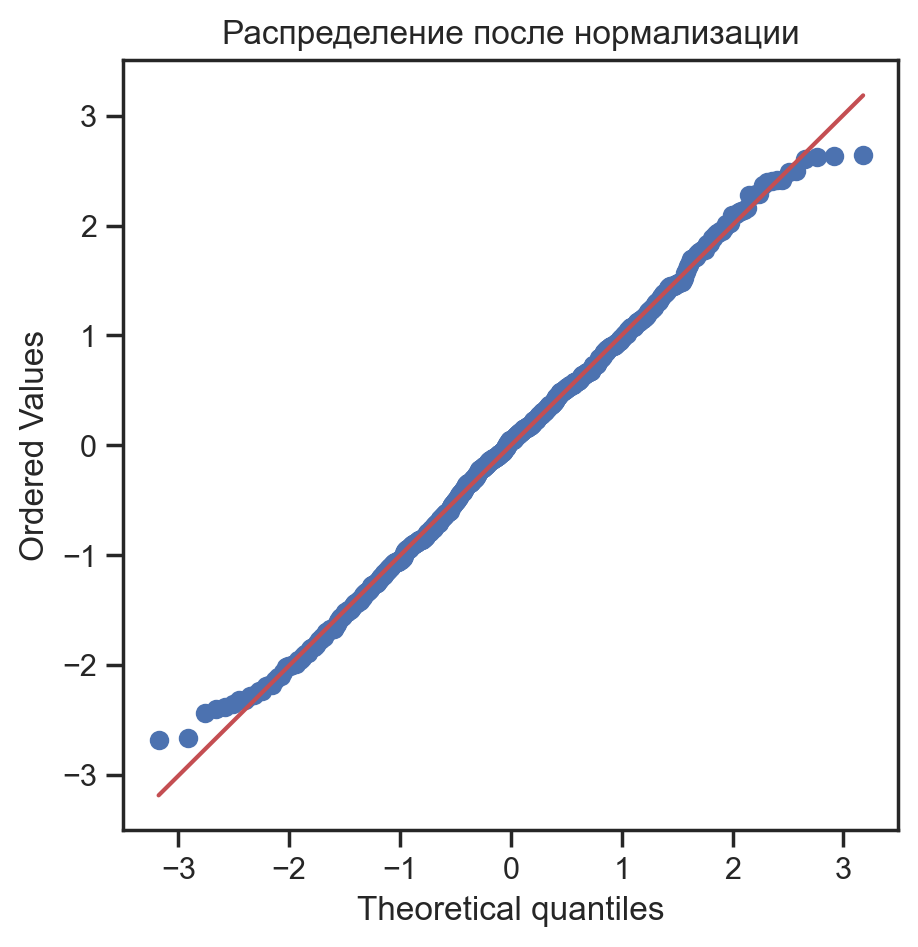

In [31]:
plt.figure(figsize=(5,5))
stats.probplot(df['Плотность, кг/м3'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 1500, 2500]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Плотность, кг/м3'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

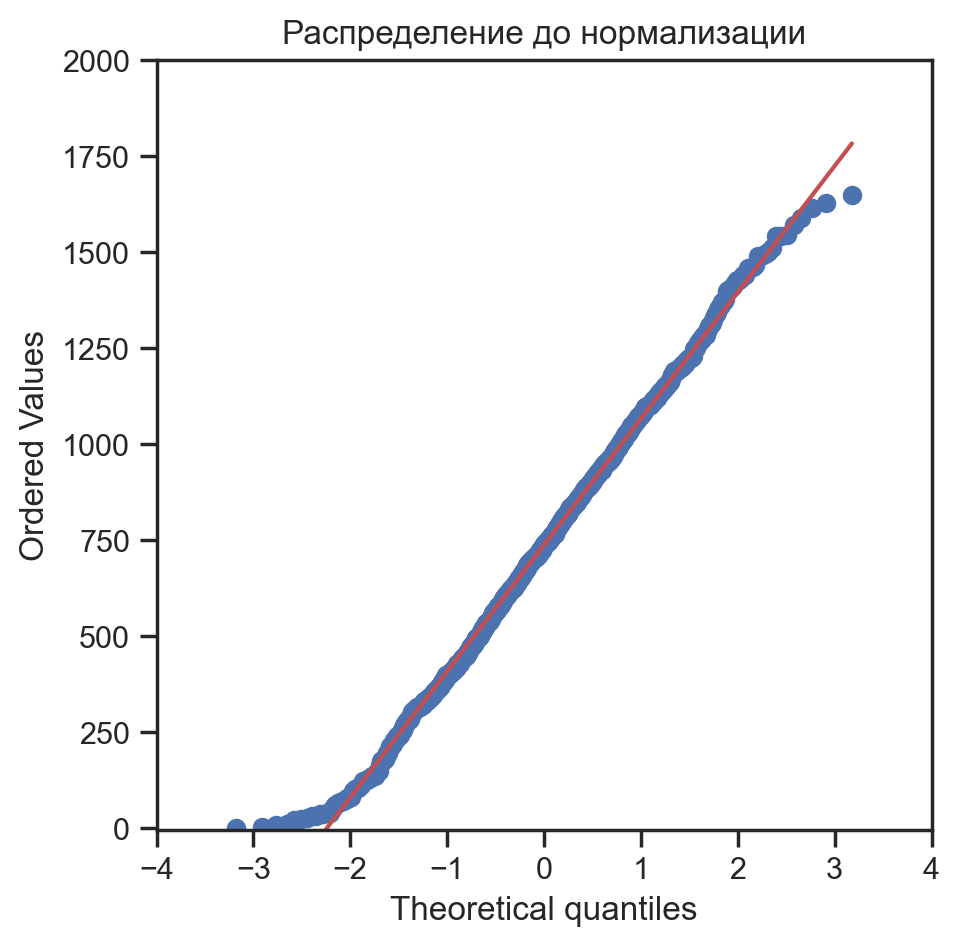

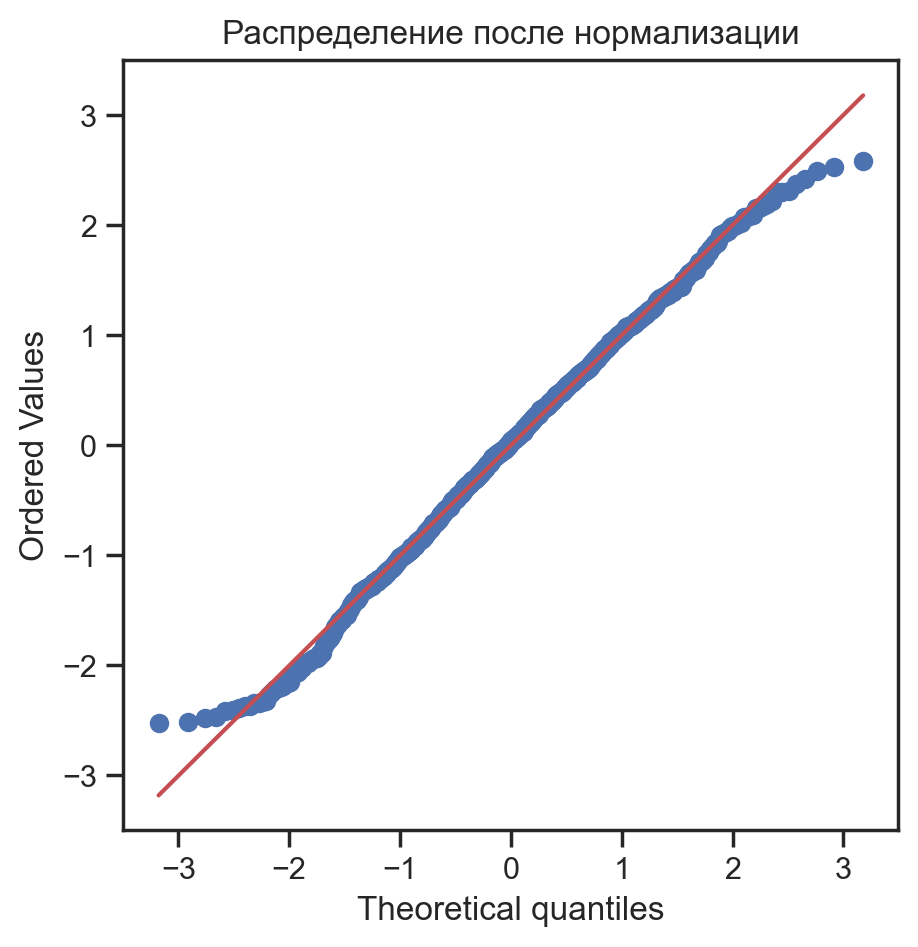

In [32]:
plt.figure(figsize=(5,5))
stats.probplot(df['модуль упругости, ГПа'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, -5, 2000]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['модуль упругости, ГПа'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

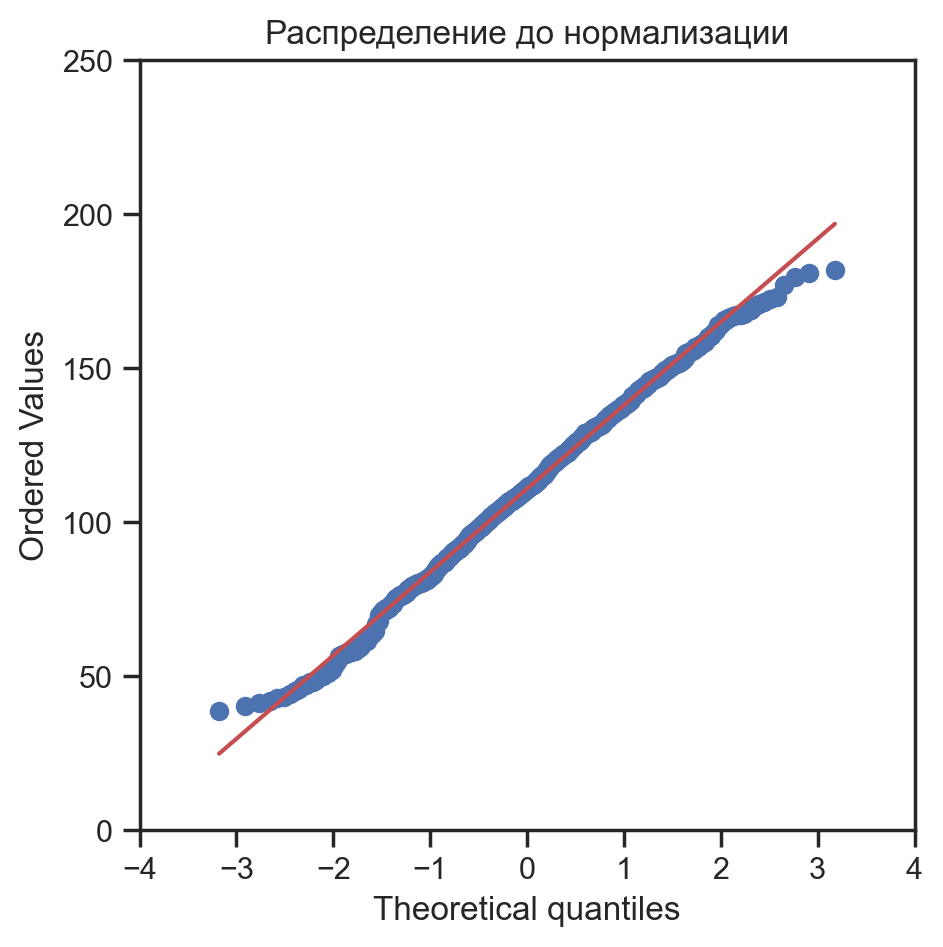

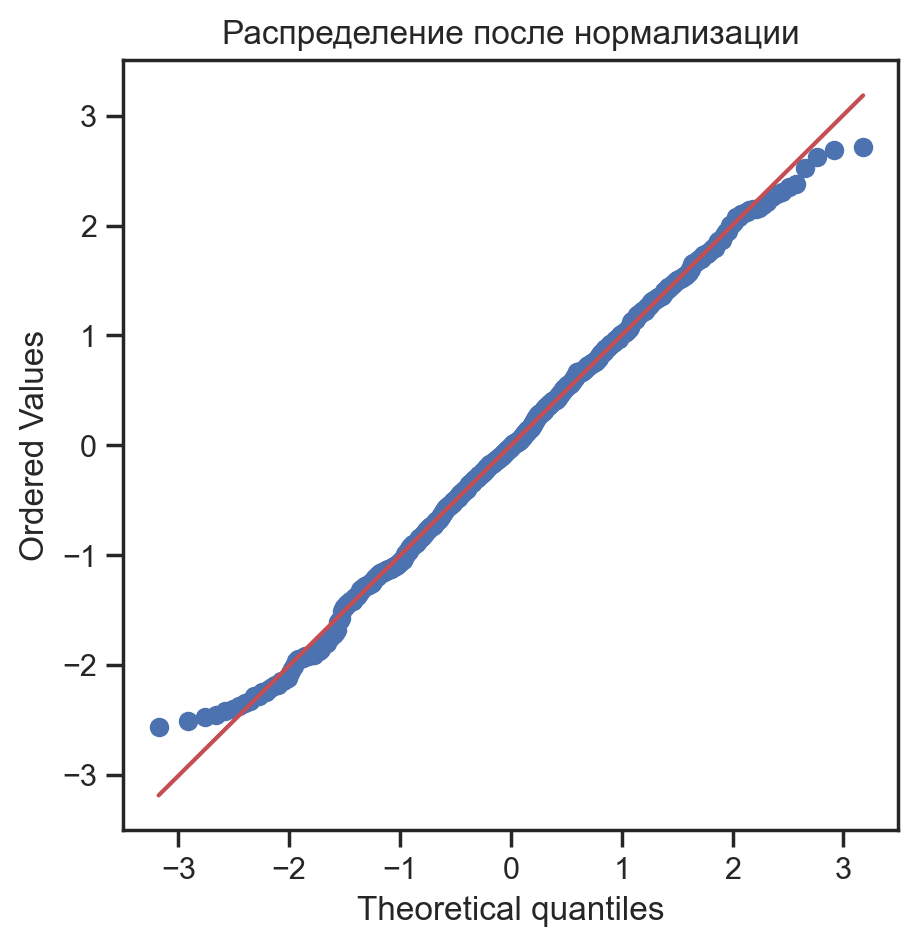

In [33]:
plt.figure(figsize=(5,5))
stats.probplot(df['Количество отвердителя, м.%'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 0, 250]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Количество отвердителя, м.%'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

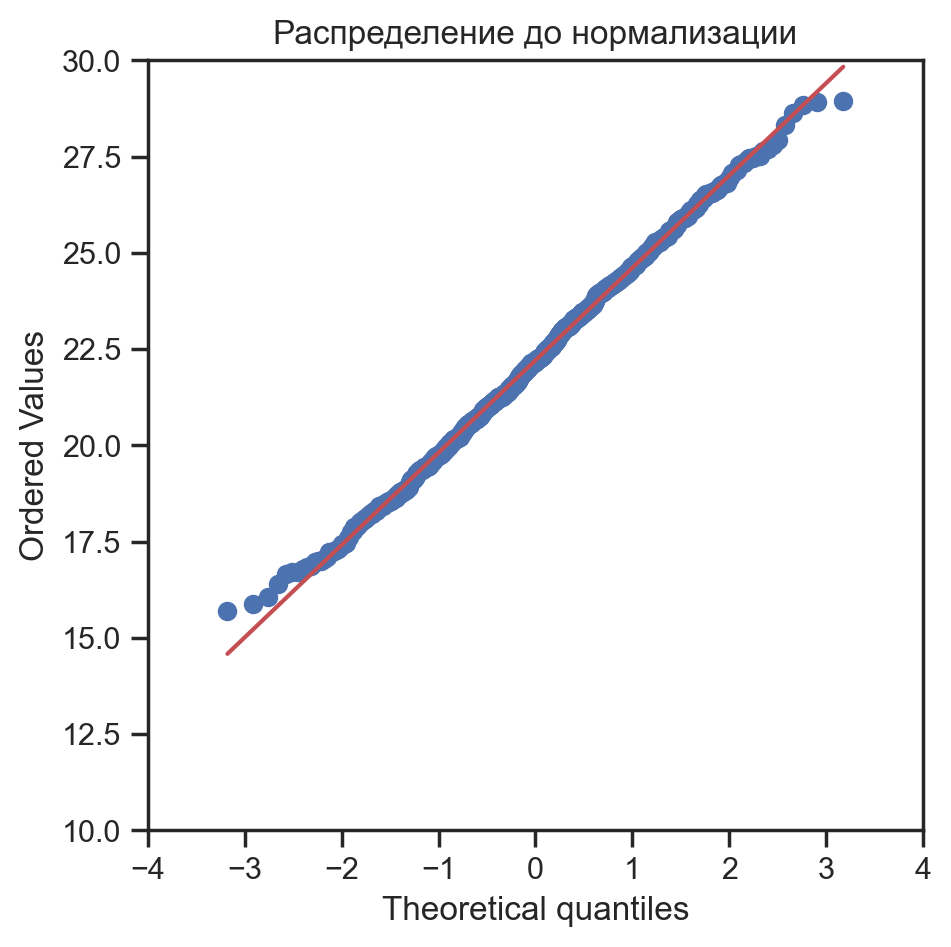

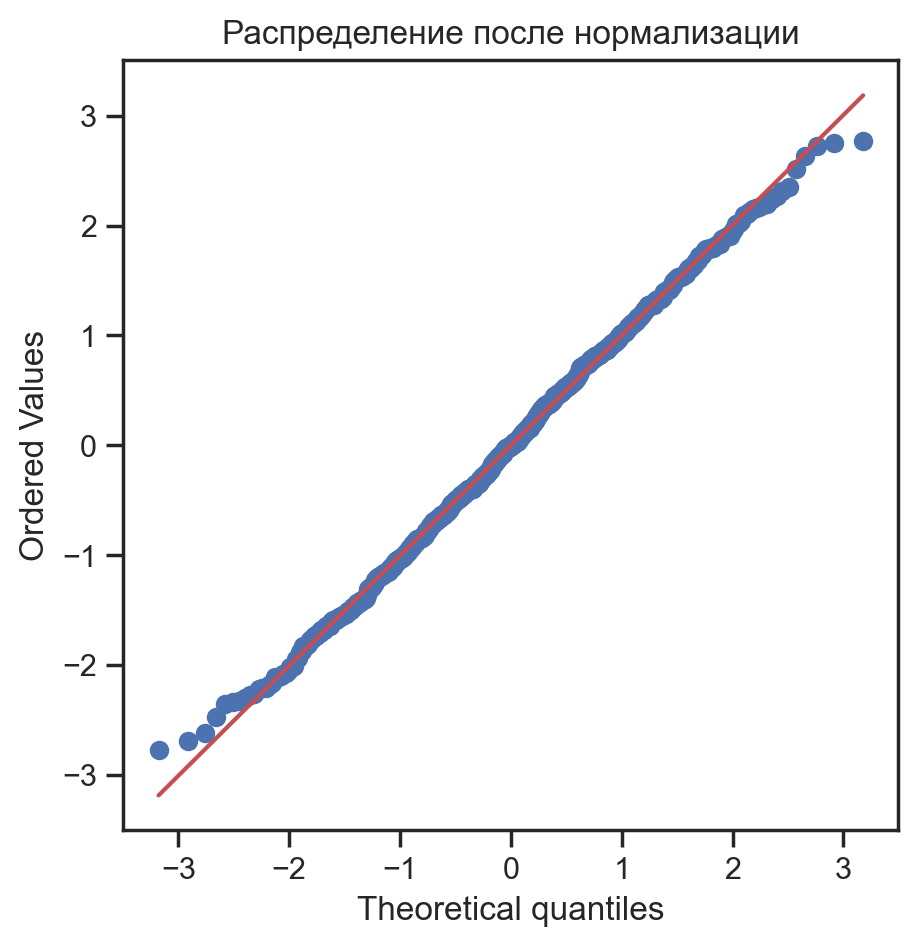

In [34]:
plt.figure(figsize=(5,5))
stats.probplot(df['Содержание эпоксидных групп,%_2'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 10, 30]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Содержание эпоксидных групп,%_2'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

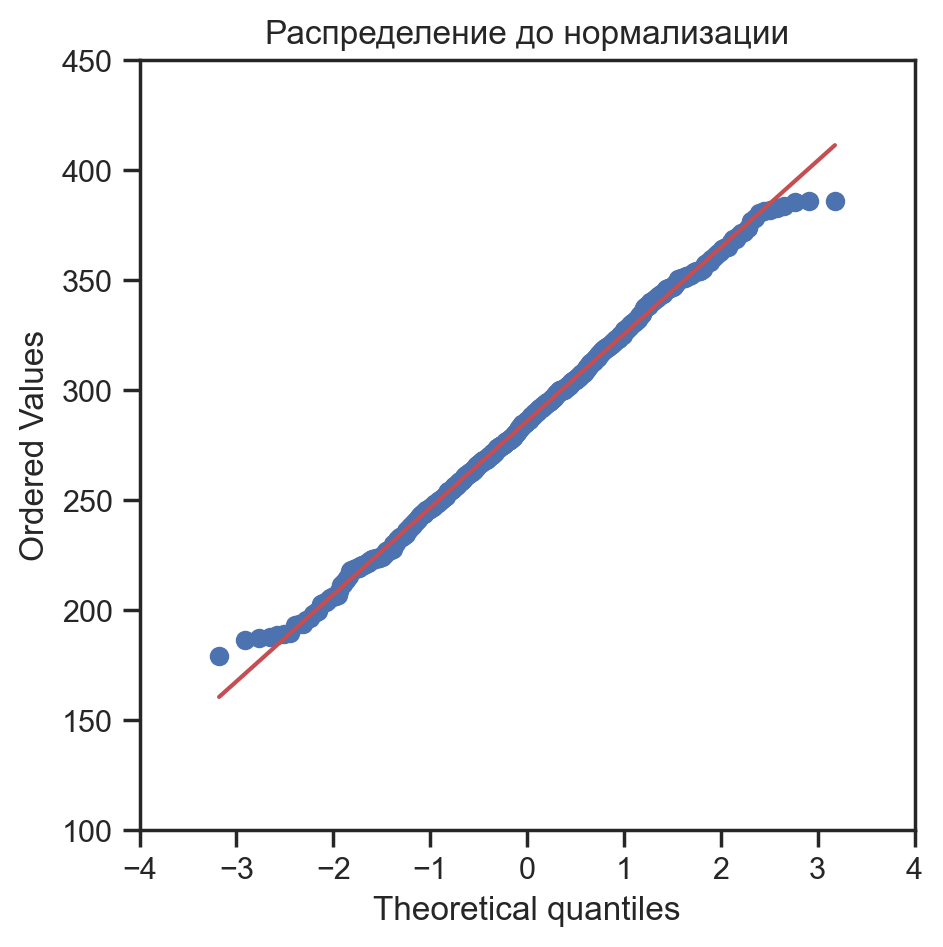

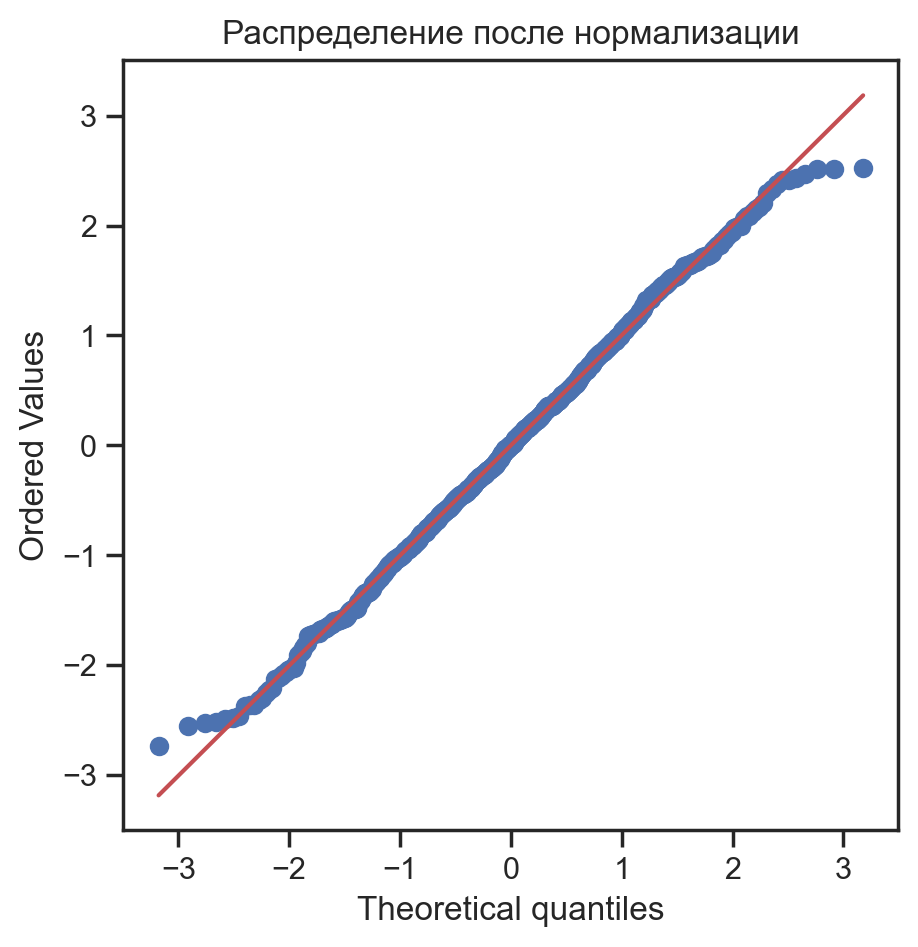

In [35]:
plt.figure(figsize=(5,5))
stats.probplot(df['Температура вспышки, С_2'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 100, 450]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Температура вспышки, С_2'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

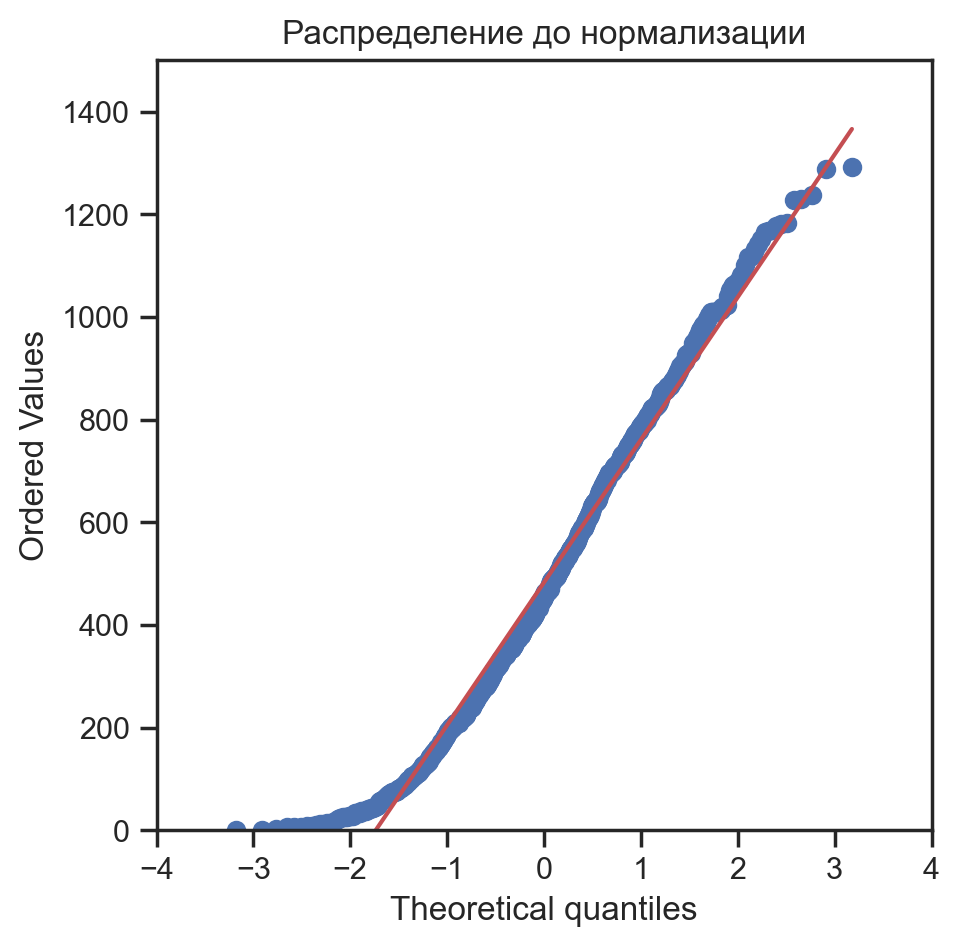

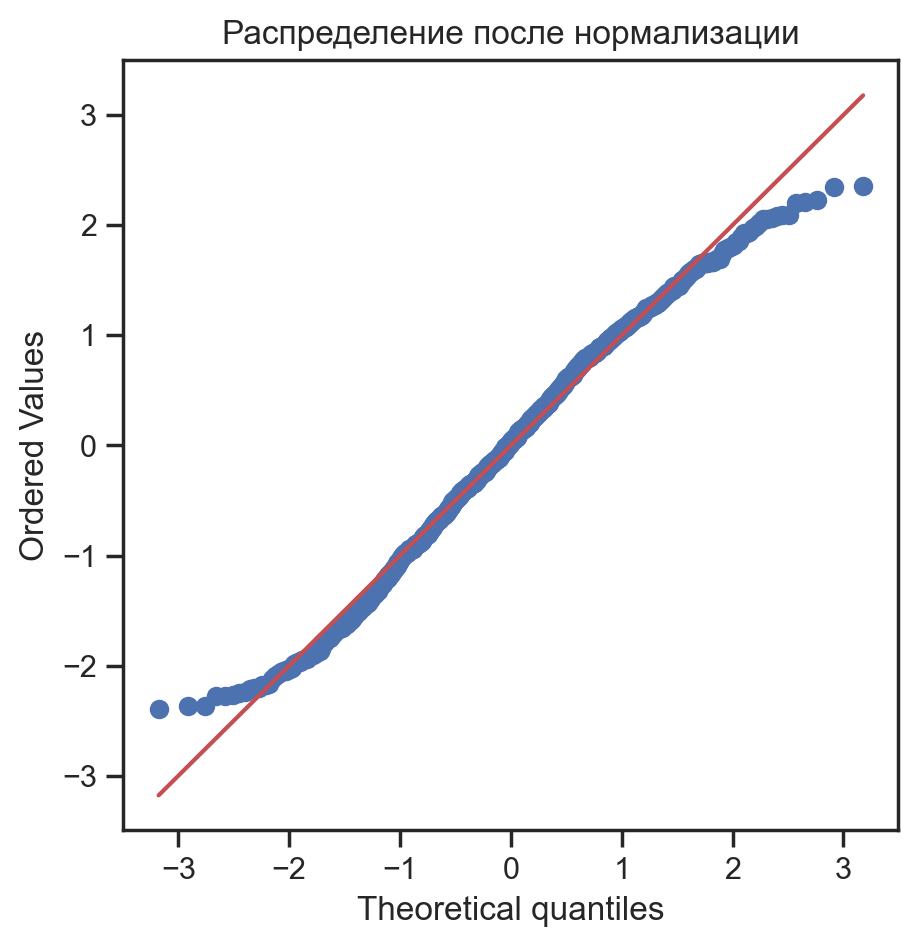

In [36]:
plt.figure(figsize=(5,5))
stats.probplot(df['Поверхностная плотность, г/м2'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 0, 1500]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Поверхностная плотность, г/м2'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

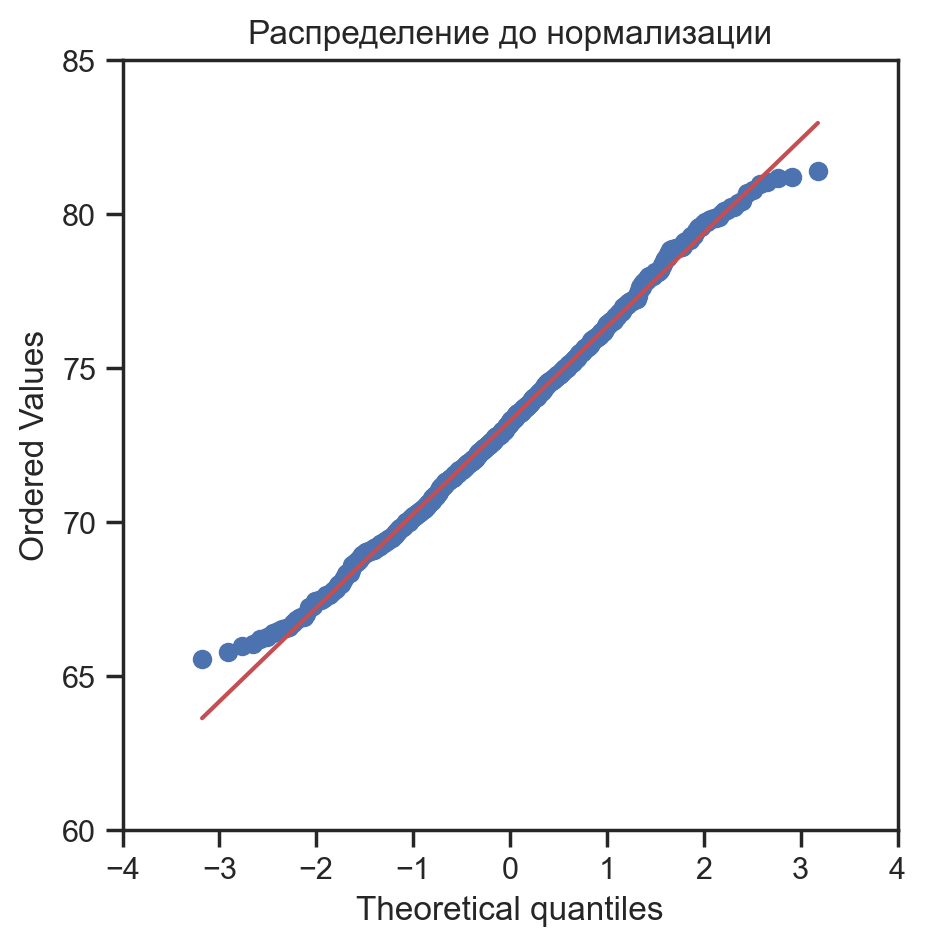

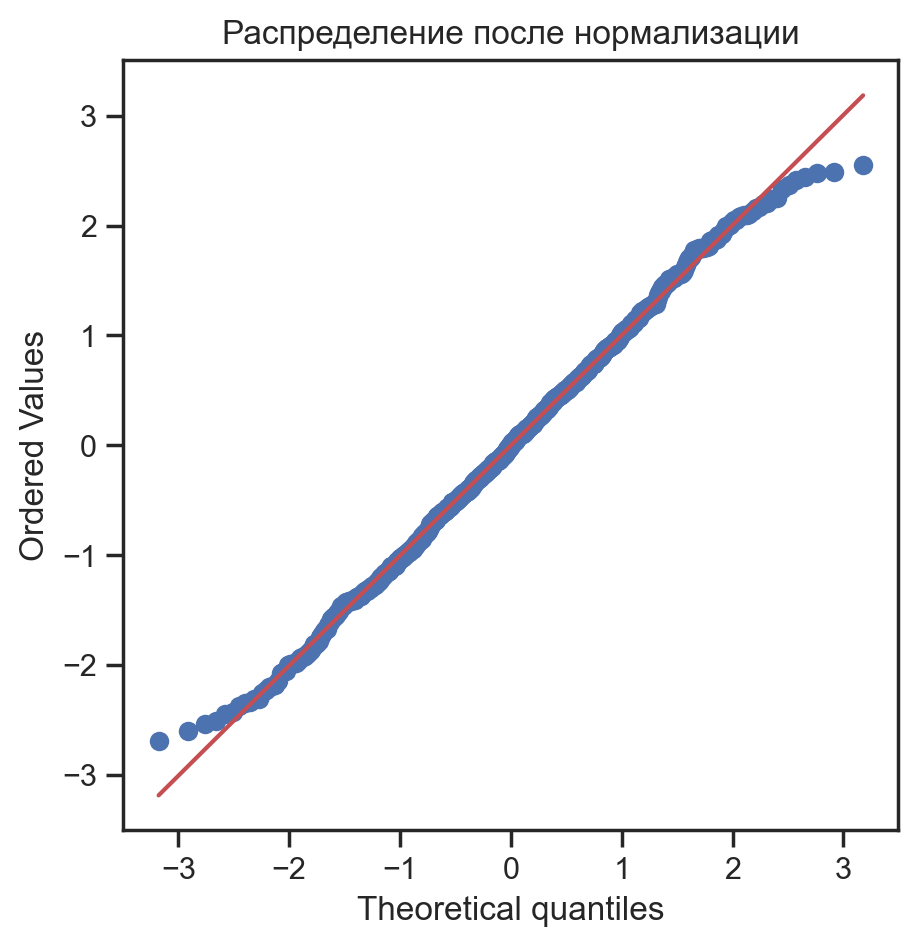

In [37]:
plt.figure(figsize=(5,5))
stats.probplot(df['Модуль упругости при растяжении, ГПа'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 60, 85]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Модуль упругости при растяжении, ГПа'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

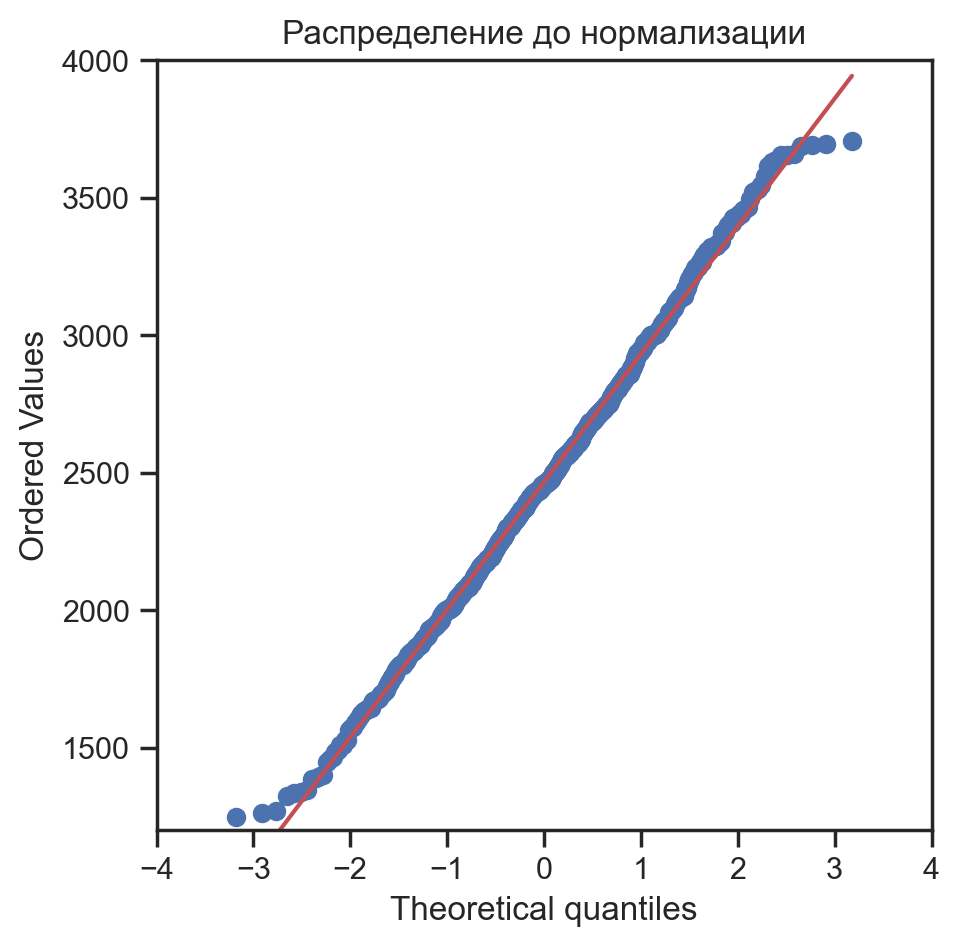

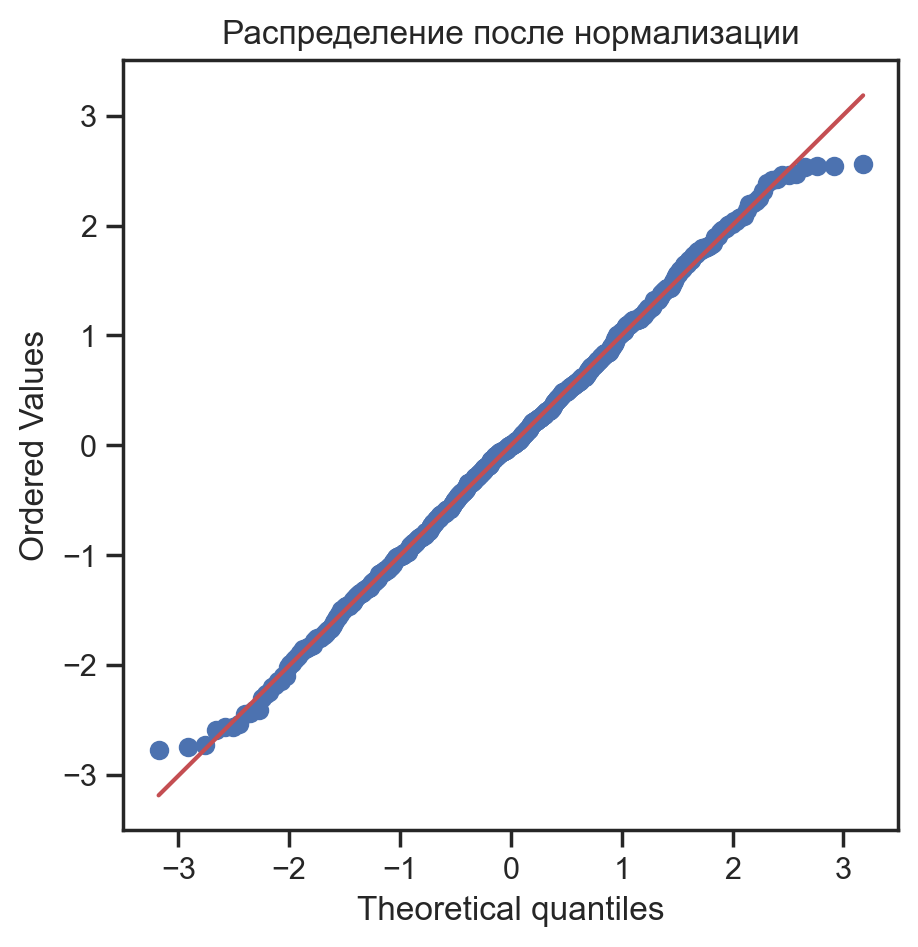

In [38]:
plt.figure(figsize=(5,5))
stats.probplot(df['Прочность при растяжении, МПа'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 1200, 4000]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Прочность при растяжении, МПа'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

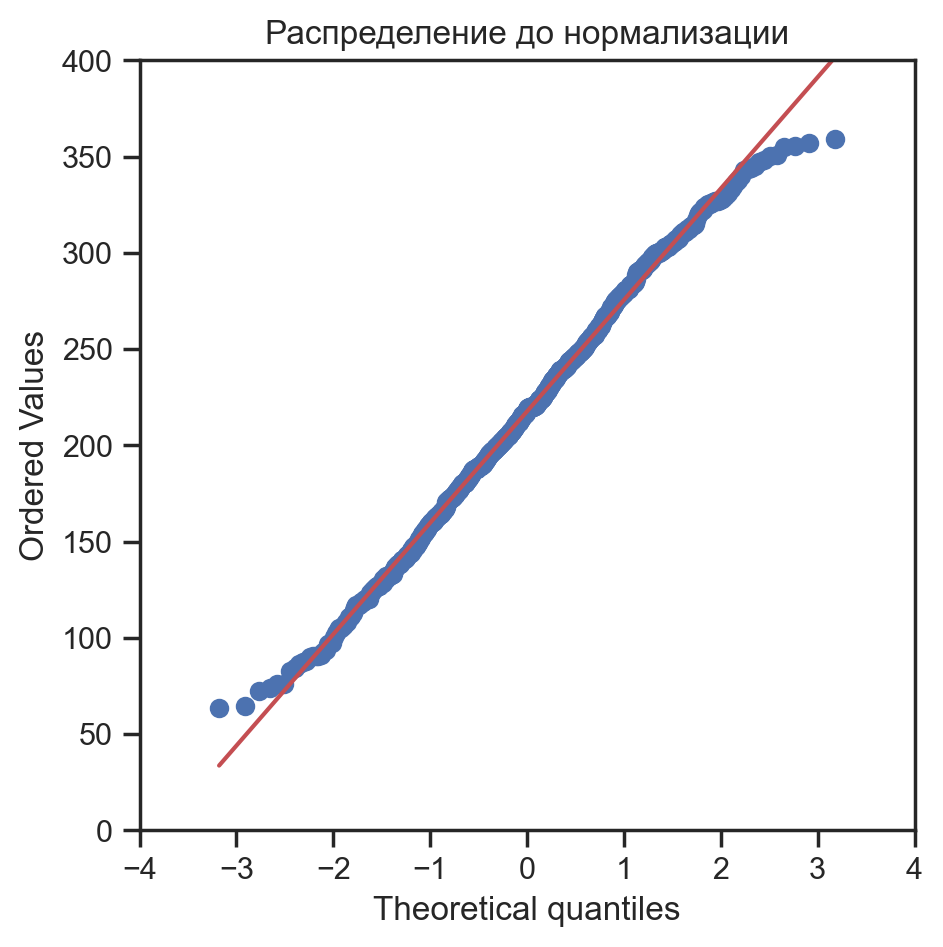

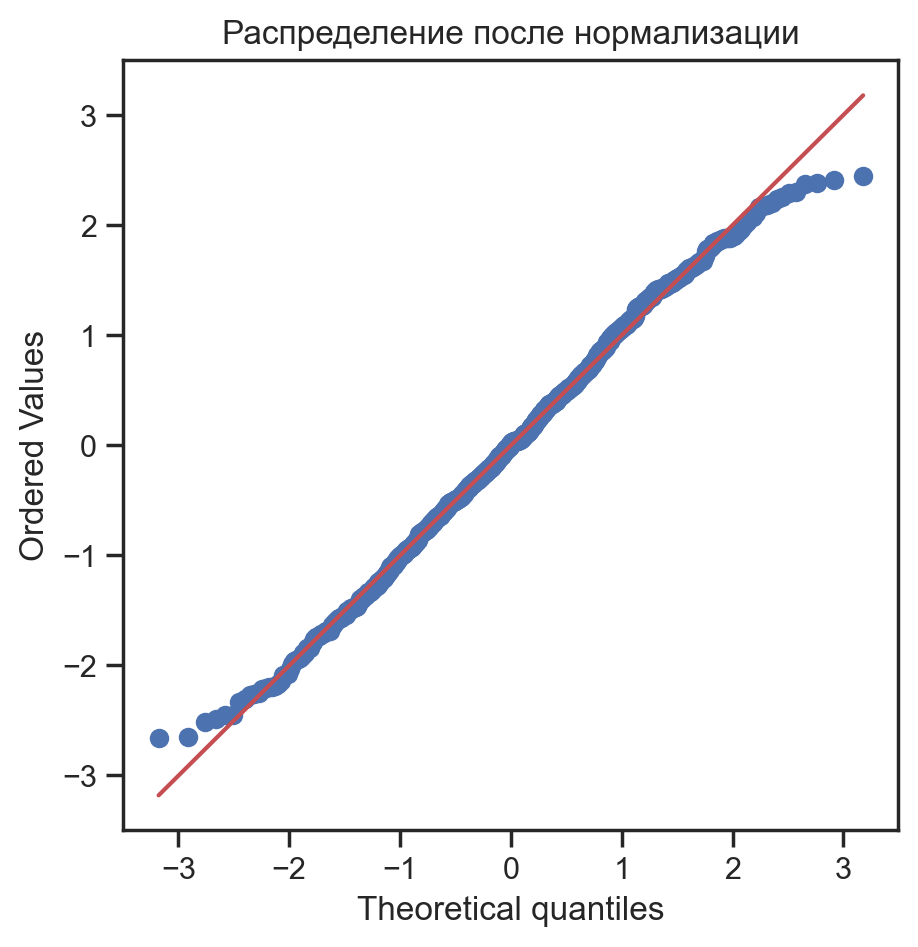

In [39]:
plt.figure(figsize=(5,5))
stats.probplot(df['Потребление смолы, г/м2'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 0, 400]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Потребление смолы, г/м2'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

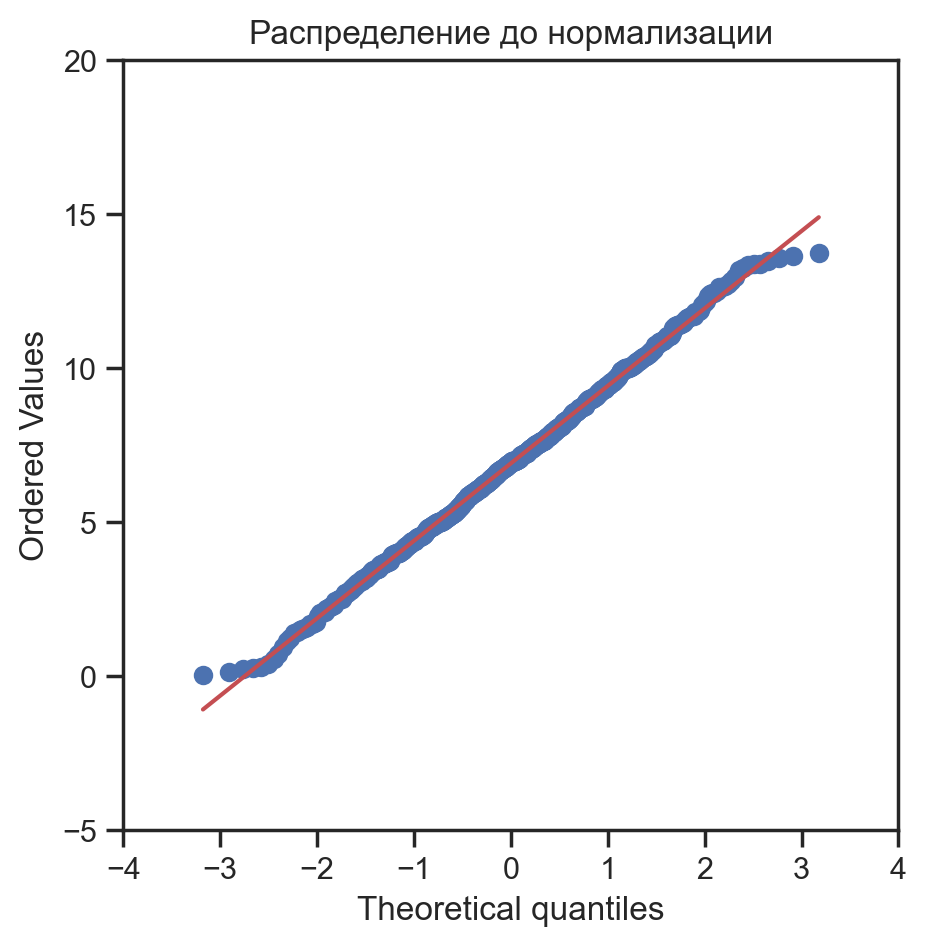

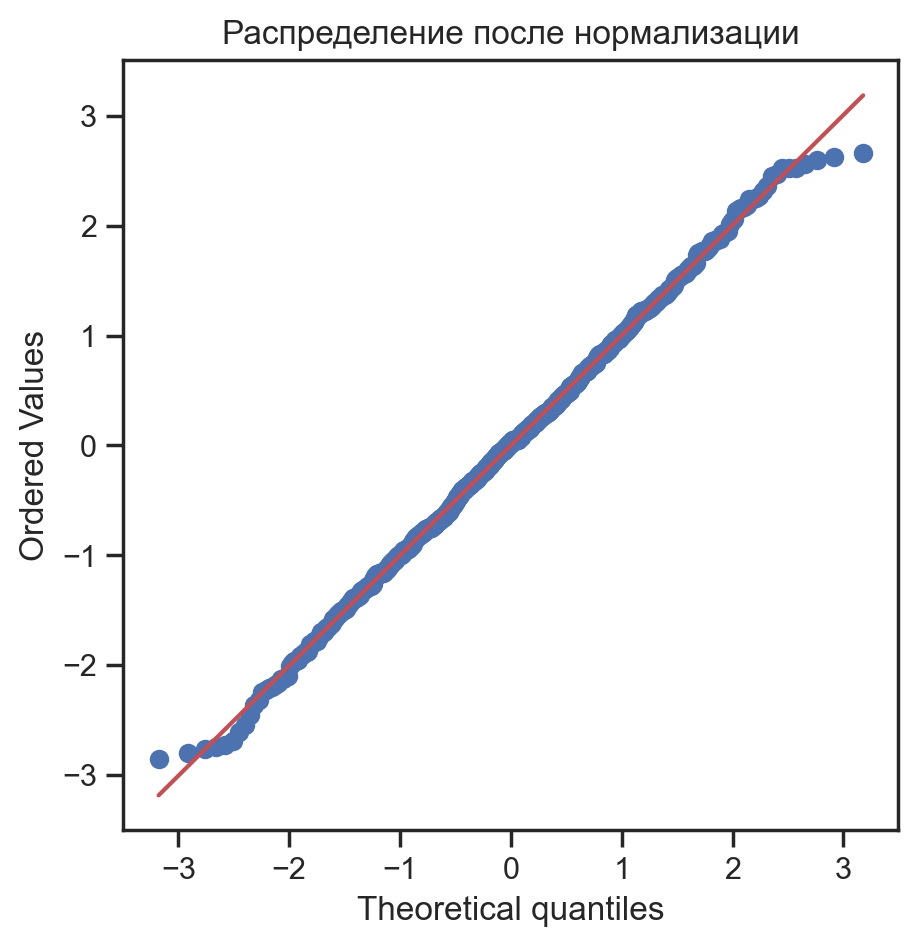

In [40]:
plt.figure(figsize=(5,5))
stats.probplot(df['Шаг нашивки'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, -5, 20]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Шаг нашивки'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

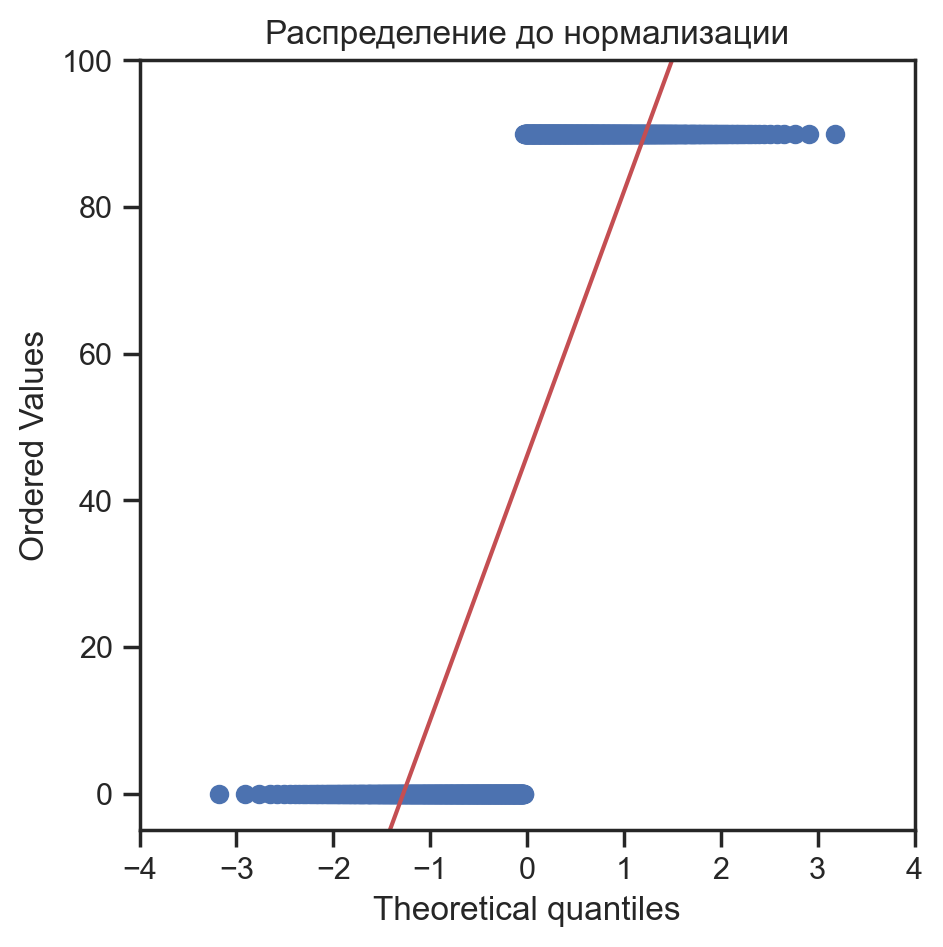

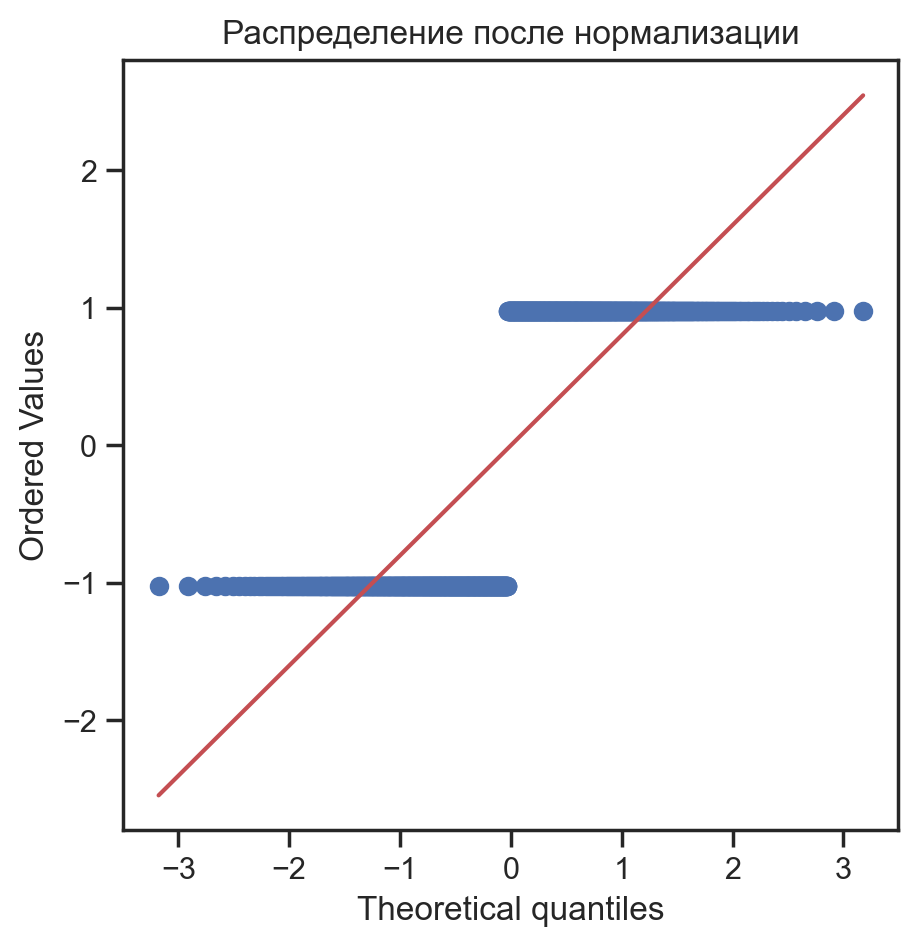

In [41]:
plt.figure(figsize=(5,5))
stats.probplot(df['Угол нашивки, град'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, -5, 100]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Угол нашивки, град'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

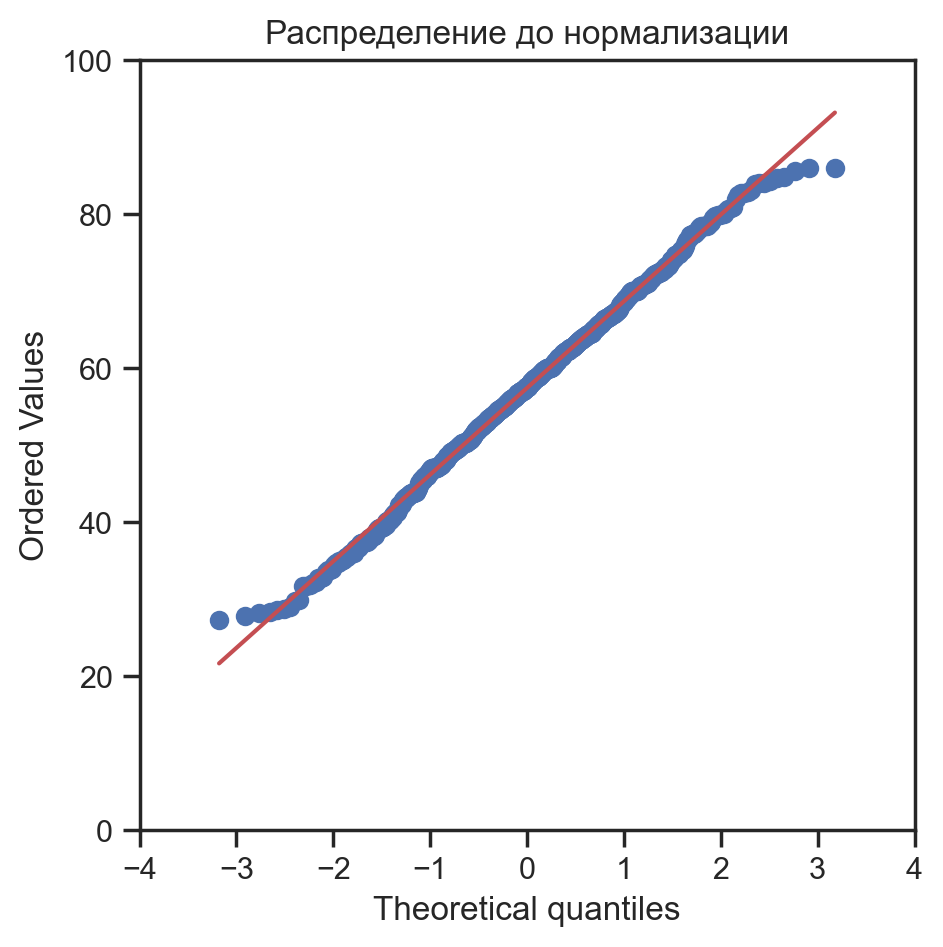

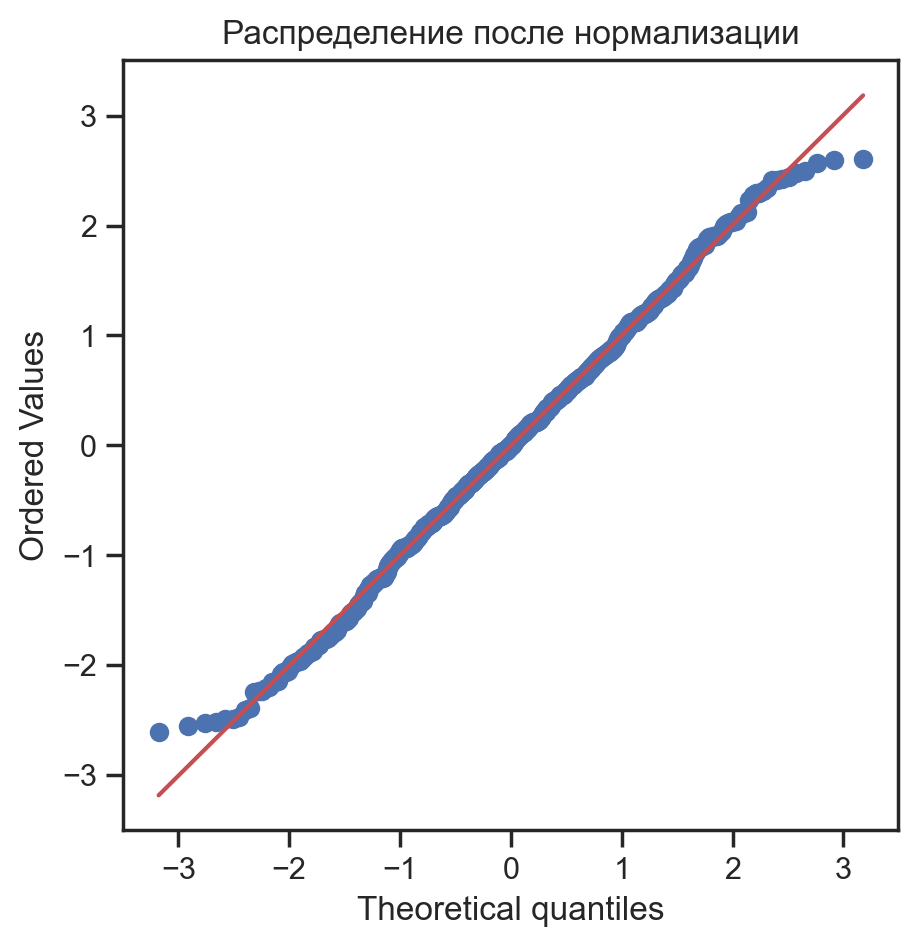

In [42]:
plt.figure(figsize=(5,5))
stats.probplot(df['Плотность нашивки'], dist='norm', plot=plt)
plt.title('Распределение до нормализации')
plt.axis([-4, 4, 0, 100]);
plt.figure(figsize=(5,5))
stats.probplot(data_norm['Плотность нашивки'], dist='norm', plot=plt)
plt.title('Распределение после нормализации');

**_Тест Шапиро-Уилка на нормальность._**

In [43]:
#загрузка метода
from scipy.stats import shapiro

In [44]:
#вывод критерия для каждого из показателей датасета до нормализации
for col in df.columns:
    shapiro (df [col])
    print (col)
    print (shapiro (df [col]))

Соотношение матрица-наполнитель
ShapiroResult(statistic=0.9970774054527283, pvalue=0.08666662871837616)
Плотность, кг/м3
ShapiroResult(statistic=0.9971369504928589, pvalue=0.09497813135385513)
модуль упругости, ГПа
ShapiroResult(statistic=0.9953528046607971, pvalue=0.006088397465646267)
Количество отвердителя, м.%
ShapiroResult(statistic=0.9962779879570007, pvalue=0.025072956457734108)
Содержание эпоксидных групп,%_2
ShapiroResult(statistic=0.9977485537528992, pvalue=0.23661871254444122)
Температура вспышки, С_2
ShapiroResult(statistic=0.9970681071281433, pvalue=0.0854324996471405)
Поверхностная плотность, г/м2
ShapiroResult(statistic=0.9777225255966187, pvalue=8.982355831355093e-11)
Модуль упругости при растяжении, ГПа
ShapiroResult(statistic=0.9962244629859924, pvalue=0.02307675965130329)
Прочность при растяжении, МПа
ShapiroResult(statistic=0.9970090985298157, pvalue=0.07800609618425369)
Потребление смолы, г/м2
ShapiroResult(statistic=0.9959738850593567, pvalue=0.01567118987441063)


_**Аналитика**: до обработки 6 из 13 показателей не проходят пороговое значение p-value < 0.05_

In [45]:
#вывод критерия для каждого из показателей датасета после нормализации
for col in data_norm.columns:
    shapiro(data_norm [col])
    print (col)
    print (shapiro (data_norm [col]))

Соотношение матрица-наполнитель
ShapiroResult(statistic=0.9974379539489746, pvalue=0.1500064581632614)
Плотность, кг/м3
ShapiroResult(statistic=0.9971350431442261, pvalue=0.09470080584287643)
модуль упругости, ГПа
ShapiroResult(statistic=0.9957846999168396, pvalue=0.011722661554813385)
Количество отвердителя, м.%
ShapiroResult(statistic=0.9970081448554993, pvalue=0.07789332419633865)
Содержание эпоксидных групп,%_2
ShapiroResult(statistic=0.9978112578392029, pvalue=0.25866833329200745)
Температура вспышки, С_2
ShapiroResult(statistic=0.9970903396606445, pvalue=0.0884123370051384)
Поверхностная плотность, г/м2
ShapiroResult(statistic=0.9903289675712585, pvalue=7.90928697824711e-06)
Модуль упругости при растяжении, ГПа
ShapiroResult(statistic=0.9970969557762146, pvalue=0.08931748569011688)
Прочность при растяжении, МПа
ShapiroResult(statistic=0.997805118560791, pvalue=0.25644078850746155)
Потребление смолы, г/м2
ShapiroResult(statistic=0.9959717988967896, pvalue=0.015621570870280266)
Уго

_**Аналитика:** после нормализации 4 из 13 показателей не проходят пороговое значение p-value < 0.05, одним из которых является "Угол нашивки", другие:_
- _модуль упругости, ГПа_
- _Поверхностная плотность, г/м2_
- _Потребление смолы, г/м2_

_Проверка нормальности статистическими тестами является очень строгой, это связано со сравнением с идеальным распределением. Поэтому, несмотря на то, что статистический тест говорит о ненормальности распределения, всегда стоит смотреть на гистограмму распределения._

_**Тепловая карта корреляции Пирсона.**_

<AxesSubplot:>

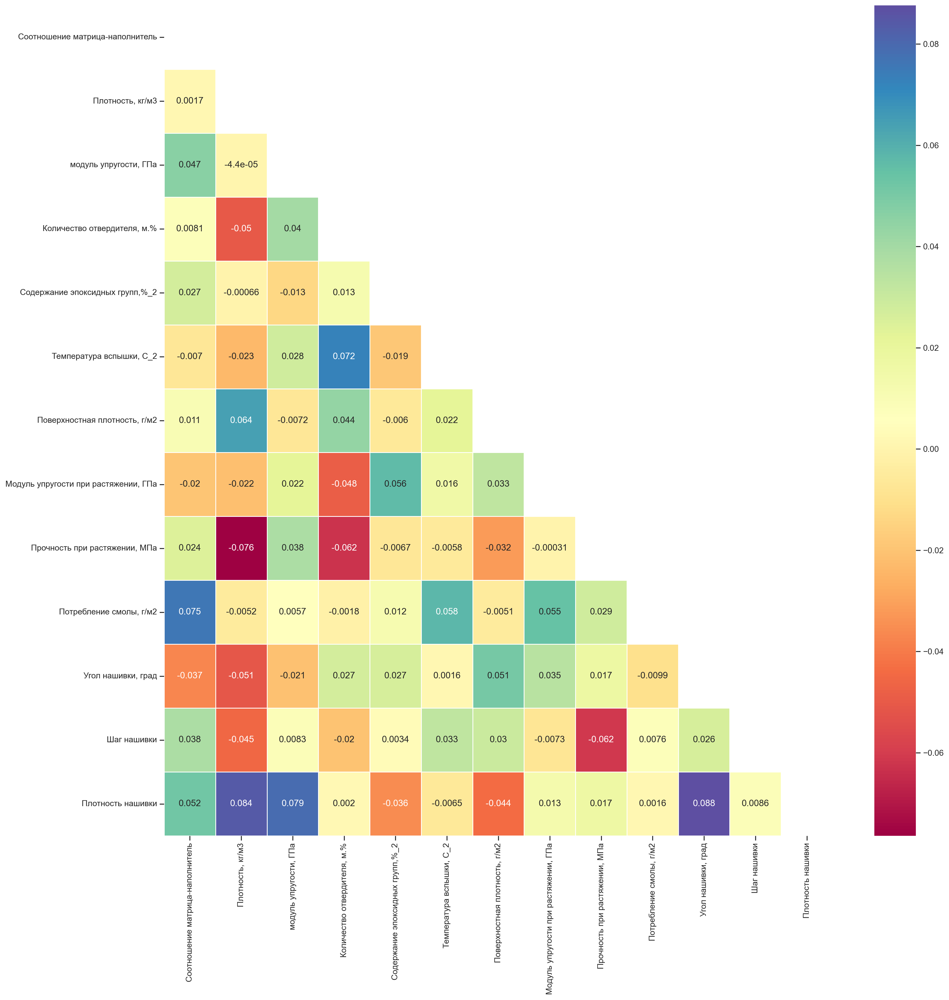

In [46]:
# построение корреляционной матрицы
matrix = np.triu (data_norm.corr())# преобразование в треугольный массив
plt.figure (figsize = (20, 20))
sns.heatmap (data_norm.corr(), annot = True, cmap = 'Spectral', linewidths =1, linecolor = 'white', mask = matrix)

_**Аналитика**: корреляционная матрица показывает полное отсутствие линейно связанных параметров. Причем это касается как связи между входными переменными и прогнозируемыми, так и входными между собой. Последнее позволяет включить все входные параметры в модели регрессии, однако можно предположить, что построение достоверного прогноза будет затруднительным._

In [47]:
#сохранение очищенного датасета в файл excel
data_norm.to_excel('data_norm.xlsx')

## Анализ и выбор регрессионных моделей прогноза для показателей:
- **_Модуль упругости при растяжении, ГПа_**
- **_Прочность при растяжении, МПа_**

### Выбор метрик.

In [48]:
#загрузка методов
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, median_absolute_error, r2_score


In [49]:
# создание класса, хранящего данные по метрикам с добавлением и удалением значений
class MetricLogger:
    
    def __init__(self):
        self.df = pd.DataFrame(
            {'metric': pd.Series([], dtype='str'),
            'alg': pd.Series([], dtype='str'),
            'value': pd.Series([], dtype='float')})

    def add(self, metric, alg, value):
        self.df.drop(self.df[(self.df['metric']==metric)&(self.df['alg']==alg)].index, inplace = True)
        temp = [{'metric':metric, 'alg':alg, 'value':value}]
        self.df = self.df.append(temp, ignore_index=True)

In [50]:
# сохранение метрик
regrMetricLogger = MetricLogger()

### Формирование обучающей и тестовой выборок для параметров "Модуль упругости при растяжении, ГПа" и "Прочность при растяжении, МПа".

_Разделение выборки на проверочную и обучающую в соотношении 70/30, исключая из датасета всех целевых параметров: "Модуля упругости при растяжении", "Прочности при растяжении" и "Соотношения матрица - наполнитель"._

In [51]:
#загрузка метода
from sklearn.model_selection import train_test_split

In [52]:
#разбиение датасета на тестовую и обучающую выборки с перемешиванием строк в случайном порядке
x_mod = data_norm.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1)
x_pr = data_norm.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа'], axis=1)
y_mod = data_norm[['Модуль упругости при растяжении, ГПа']]
y_pr = data_norm[['Прочность при растяжении, МПа']]

X_train_mod, X_test_mod, y_train_mod, y_test_mod = train_test_split(x_mod, y_mod, test_size=0.3, random_state=1)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(x_pr, y_pr, test_size=0.3, random_state=1)


In [53]:
# проверка разделения выборок
print ('Модуль упругости при растяжении, ГПа')
print ('name', '\t','rows','columns')
print ('data    ', data_norm.shape)
print ('x train ', X_train_mod.shape)
print ('x test  ', X_test_mod.shape)
print ('y train ', y_train_mod.shape)
print ('y test  ', y_test_mod.shape)

Модуль упругости при растяжении, ГПа
name 	 rows columns
data     (936, 13)
x train  (655, 10)
x test   (281, 10)
y train  (655, 1)
y test   (281, 1)


In [54]:
# проверка разделения выборок
print ('Прочность при растяжении, МПа')
print ('name', '\t','rows','columns')
print ('data    ', data_norm.shape)
print ('x train ', X_train_pr.shape)
print ('x test  ', X_test_pr.shape)
print ('y train ', y_train_pr.shape)
print ('y test  ', y_test_pr.shape)

Прочность при растяжении, МПа
name 	 rows columns
data     (936, 13)
x train  (655, 10)
x test   (281, 10)
y train  (655, 1)
y test   (281, 1)


### Прогнозирование параметра "Модуль упругости при растяжении, ГПа".

**Построение базового решения моделей без подбора гиперпараметров.**
Обучение моделей производится на основе обучающей выборки, оценка качества - на основе тестовой выборки.

In [55]:
# загрузка методов
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

**Оценка качества базового решения для предсказания 'Модуля упругости при растяжении, ГПа'.**

In [56]:
# выбранные модели
regr_models = {'LR': LinearRegression(),
               'L1': Lasso(alpha = 0.2),
               'L2': Ridge(alpha = 0.2),
               'KNN_5':KNeighborsRegressor(n_neighbors=5),
               'SVR':SVR(),
               'Tree':DecisionTreeRegressor(),
               'RF':RandomForestRegressor(),
               'GB':GradientBoostingRegressor()
               }

In [57]:
# создание функции для прохождения по заданной модели, расчета ее метрик и вывода на печать
def regr_train_model_m(model_name, model, regrMetricLogger):
    model.fit(X_train_mod, y_train_mod.values.ravel())
    Y_pred_mod = model.predict(X_test_mod)
    
    mae = mean_absolute_error(y_test_mod, Y_pred_mod)
    mse = mean_squared_error(y_test_mod, Y_pred_mod)
    r2 = r2_score(y_test_mod, Y_pred_mod)

    regrMetricLogger.add('MAE', model_name, mae)
    regrMetricLogger.add('MSE', model_name, mse)
    regrMetricLogger.add('R2', model_name, r2)    
    
    print('{} \t MAE={}, MSE={}, R2={}'.format(
        model_name, round(mae, 3), round(mse, 3), round(r2, 3)))

In [58]:
# отключение предупреждений о будующих ошибках
import warnings
warnings.filterwarnings("default", category=FutureWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [59]:
# вывод моделей с метриками
for model_name, model in regr_models.items():
    regr_train_model_m(model_name, model, regrMetricLogger)

LR 	 MAE=0.839, MSE=1.037, R2=-0.02
L1 	 MAE=0.83, MSE=1.017, R2=-0.001
L2 	 MAE=0.839, MSE=1.037, R2=-0.02
KNN_5 	 MAE=0.922, MSE=1.27, R2=-0.249
SVR 	 MAE=0.897, MSE=1.201, R2=-0.182
Tree 	 MAE=1.206, MSE=2.242, R2=-1.205
RF 	 MAE=0.86, MSE=1.126, R2=-0.108
GB 	 MAE=0.894, MSE=1.198, R2=-0.179


_**Аналитика:** коэффициент детерминации во всех моделях отрицательный. Это свидетельствует о том, что построенные модели очень плохо описывают данные и зависимости в них. По входящим параметрам невозможно построить достоверный прогноз расчета модуля упругости. Модели линейной регрессии дают около нулевое значение коэффициента детерминации, на втором месте стоит модель случайного леса. Возможно, при подборе гиперпараметров, модель сможет дать лучший результат._

**Подбор гиперпараметров для показателя "Модуль упругости при растяжении, ГПа" в моделях Случайного леса и k - ближайших соседей.**

**Случайный лес.**

In [60]:
#загрузка метода
from sklearn.model_selection import GridSearchCV

In [61]:
# определение пула параметров Случайного леса
parameters_rf_mod = {
    'n_estimators': [50, 60, 70, 80, 90], #число деревьев
    'max_depth': [2, 3, 4, 5, 6, 7, 8], # максимальная глубина деревьев
    'criterion': ['squared_error', 'absolute_error'],
    'max_features': ['auto', 'sqrt', 'log2']}

In [62]:
#поиск лучших параметров
rf_model = RandomForestRegressor()

grid_search_rf = GridSearchCV(estimator = rf_model, param_grid = parameters_rf_mod, n_jobs=-1, cv=10)
grid_search_rf.fit(X_train_mod, y_train_mod.values.ravel()) 
best_rf_model = grid_search_rf.best_estimator_ 

grid_search_rf.best_params_

{'criterion': 'squared_error',
 'max_depth': 5,
 'max_features': 'log2',
 'n_estimators': 70}

In [63]:
# оценка метрики для лучших критериев метода Случайного леса
y_pred_mod_rf = best_rf_model.predict(X_test_mod)

print('MAE:', mean_absolute_error(y_test_mod, y_pred_mod_rf))
print('MSE:', mean_squared_error(y_test_mod, y_pred_mod_rf)) 
print('r2:', r2_score(y_test_mod, y_pred_mod_rf))

MAE: 0.8437108541438975
MSE: 1.0492610993756895
r2: -0.03216313079143984


_**Аналитика:** коэффициент детерминации увеличился незначительно._

**k-ближайших соседей.**

In [64]:
#определение пула параметров
n_range_mod = np.array(range(1,10,1))
tuned_parameters_mod = [{'n_neighbors': n_range_mod}]
tuned_parameters_mod

[{'n_neighbors': array([1, 2, 3, 4, 5, 6, 7, 8, 9])}]

In [65]:
#поиск лучших параметров
regr_gs_mod = GridSearchCV(KNeighborsRegressor(), tuned_parameters_mod, cv=5, scoring='neg_mean_squared_error')
regr_gs_mod.fit(X_train_mod, y_train_mod)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid=[{'n_neighbors': array([1, 2, 3, 4, 5, 6, 7, 8, 9])}],
             scoring='neg_mean_squared_error')

In [66]:
# лучшее число "соседей"
regr_gs_mod.best_estimator_

KNeighborsRegressor(n_neighbors=9)

In [67]:
# оценка метрики
y_pred_mod_kn = regr_gs_mod.predict(X_test_mod)

print('MAE:', mean_absolute_error(y_test_mod, y_pred_mod_kn))
print('MSE:', mean_squared_error(y_test_mod, y_pred_mod_kn)) 
print('r2:', r2_score(y_test_mod, y_pred_mod_kn))

MAE: 0.8574722781986547
MSE: 1.0990944148933284
r2: -0.08118440013327288


_**Аналитика:** коэффициент детерминации увеличился в 36 раз, однако этого все еще недостаточно для построения прогноза._

### Прогнозирование параметра "Прочность при растяжении, МПа".

#### **Оценка качества базового решения для предсказания "Прочности при растяжении, МПа".**

In [68]:
# создание функции для прохождения по заданной модели, расчета ее метрик и вывода на печать
def regr_train_model_pr(model_name, model, regrMetricLogger):
    model.fit(X_train_pr, y_train_pr.values.ravel())
    Y_pred_pr = model.predict(X_test_pr)
    
    mae = mean_absolute_error(y_test_pr, Y_pred_pr)
    mse = mean_squared_error(y_test_pr, Y_pred_pr)
    r2 = r2_score(y_test_pr, Y_pred_pr)

    regrMetricLogger.add('MAE', model_name, mae)
    regrMetricLogger.add('MSE', model_name, mse)
    regrMetricLogger.add('R2', model_name, r2)    
    
    print('{} \t MAE={}, MSE={}, R2={}'.format(
        model_name, round(mae, 3), round(mse, 3), round(r2, 3)))

In [69]:
# вывод моделей с метриками
for model_name, model in regr_models.items():
    regr_train_model_pr(model_name, model, regrMetricLogger)

LR 	 MAE=0.796, MSE=0.979, R2=-0.006
L1 	 MAE=0.794, MSE=0.983, R2=-0.01
L2 	 MAE=0.796, MSE=0.979, R2=-0.006
KNN_5 	 MAE=0.849, MSE=1.153, R2=-0.186
SVR 	 MAE=0.84, MSE=1.112, R2=-0.143
Tree 	 MAE=1.057, MSE=1.772, R2=-0.821
RF 	 MAE=0.818, MSE=1.019, R2=-0.048
GB 	 MAE=0.826, MSE=1.027, R2=-0.055


_**Аналитика:** базовые модели не могут решить поставленную задачу, по входящим параметрам невозможно построить достоверный прогноз расчета прочности при растяжениии. Модели линейной регрессси дают околонулевое значение коэффициента детерминации. Возможно, при подборе гиперпараметров метод К-ближайших соседей может дать лучший результат._

**Подбор гиперпараметров для показателя "Прочность при растяжении, МПа" для метода k-ближайших соседей..**

In [70]:
#определение пула параметров
n_range = np.array(range(1,20,1))
tuned_parameters = [{'n_neighbors': n_range}]
tuned_parameters

[{'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
         18, 19])}]

In [71]:
# поиск лучших параметров
regr_gs = GridSearchCV(KNeighborsRegressor(), tuned_parameters, cv=5, scoring='neg_mean_squared_error')
regr_gs.fit(X_train_pr, y_train_pr)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid=[{'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])}],
             scoring='neg_mean_squared_error')

In [72]:
# лучшее число "соседей"
regr_gs.best_estimator_

KNeighborsRegressor(n_neighbors=19)

In [73]:
# вывод метрики
y_pred_pr_kn = regr_gs.predict(X_test_pr)

print('MAE:', mean_absolute_error(y_test_pr, y_pred_pr_kn))
print('MSE:', mean_squared_error(y_test_pr, y_pred_pr_kn)) 
print('r2:', r2_score(y_test_pr, y_pred_pr_kn))

MAE: 0.823184948992264
MSE: 1.0511531781928798
r2: -0.08036845772361878


_**Аналитика:** коэффициент детерминации увеличился, однако этого все еще недостаточно для построения прогноза._

## Анализ и выбор регрессионных моделей прогноза для параметра "Соотношение матрица - наполнитель".

In [74]:
#разбиение датасета на тестовую и обучающую выборки с перемешиванием строк в случайном порядке
x_s = data_norm.drop(['Соотношение матрица-наполнитель'], axis=1)
y_s = data_norm[['Соотношение матрица-наполнитель']]

x_train_s, x_test_s, y_train_s, y_test_s = train_test_split(x_s, y_s, test_size=0.3, random_state=1)

In [75]:
# проверка разделения выборок
print ('Соотношение матрица-наполнитель')
print ('name', '\t','rows','columns')
print ('data    ', data_norm.shape)
print ('x train ', x_train_s.shape)
print ('x test  ', x_test_s.shape)
print ('y train ', y_train_s.shape)
print ('y test  ', y_test_s.shape)

Соотношение матрица-наполнитель
name 	 rows columns
data     (936, 13)
x train  (655, 12)
x test   (281, 12)
y train  (655, 1)
y test   (281, 1)


In [76]:
# создание функции для прохождения по заданной модели, расчета ее метрик и вывода на печать
def regr_train_model_s(model_name, model, regrMetricLogger):
    model.fit(x_train_s, y_train_s.values.ravel())
    Y_pred_s = model.predict(x_test_s)
    
    mae = mean_absolute_error(y_test_s, Y_pred_s)
    mse = mean_squared_error(y_test_s, Y_pred_s)
    r2 = r2_score(y_test_s, Y_pred_s)

    regrMetricLogger.add('MAE', model_name, mae)
    regrMetricLogger.add('MSE', model_name, mse)
    regrMetricLogger.add('R2', model_name, r2)    
    
    print('{} \t MAE={}, MSE={}, R2={}'.format(
        model_name, round(mae, 3), round(mse, 3), round(r2, 3)))

In [77]:
# вывод моделей с метриками
for model_name, model in regr_models.items():
    regr_train_model_pr(model_name, model, regrMetricLogger)

LR 	 MAE=0.796, MSE=0.979, R2=-0.006
L1 	 MAE=0.794, MSE=0.983, R2=-0.01
L2 	 MAE=0.796, MSE=0.979, R2=-0.006
KNN_5 	 MAE=0.849, MSE=1.153, R2=-0.186
SVR 	 MAE=0.84, MSE=1.112, R2=-0.143
Tree 	 MAE=1.027, MSE=1.707, R2=-0.755
RF 	 MAE=0.826, MSE=1.036, R2=-0.065
GB 	 MAE=0.825, MSE=1.026, R2=-0.054


_**Аналитика:** коэффициент детерминации во всех моделях отрицательный. Это свидетельствует о том, что построенные модели очень плохо описывают данные и зависимости в них. По входящим параметрам невозможно построить достоверный прогноз расчета модуля упругости. Модели линейной регрессси дают околонулевое значение коэффициента детерминации, на втором месте стоит модель случайного леса. Возможно, при подборе гиперпараметров, модель сможет дать лучший результат, также рассмотрим метод К-ближайших соседей._

**Подбор гиперпараметров для метода k-ближайших соседей.**

In [78]:
#определение пула параметров
n_range_s = np.array(range(1,30,1))
tuned_parameters_s = [{'n_neighbors': n_range_s}]
tuned_parameters_s

[{'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
         18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])}]

In [79]:
# поиск лучших параметров
regr_gs_s = GridSearchCV(KNeighborsRegressor(), tuned_parameters_s, cv=5, scoring='neg_mean_squared_error')
regr_gs_s.fit(x_train_s, y_train_s)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid=[{'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])}],
             scoring='neg_mean_squared_error')

In [80]:
# лучшее число "соседей"
regr_gs_s.best_estimator_

KNeighborsRegressor(n_neighbors=29)

In [81]:
# вывод метрики
y_pred_s_kn = regr_gs_s.predict(x_test_s)

print('MAE:', mean_absolute_error(y_test_s, y_pred_s_kn))
print('MSE:', mean_squared_error(y_test_s, y_pred_s_kn)) 
print('r2:', r2_score(y_test_s, y_pred_s_kn))

MAE: 0.8473776588950028
MSE: 1.0737710117903967
r2: -0.05067051499765052


**Подбор гиперпараметров для метода Случайный лес.**

In [82]:
# определение пула параметров Случайного леса
parameters_rf_s = {
    'n_estimators': [110, 120, 130], #число деревьев
    'max_depth': [2, 3, 4, 5, 6, 7], # максимальная глубина деревьев
    'criterion': ['squared_error', 'absolute_error'],
    'max_features': ['auto', 'sqrt', 'log2']}

In [83]:
# поиск лучших параметров
rf_model_s = RandomForestRegressor()

grid_search_rf_s = GridSearchCV(estimator = rf_model_s, param_grid = parameters_rf_s, n_jobs=-1, cv=10)
grid_search_rf_s.fit(x_train_s, y_train_s.values.ravel()) 
best_rf_model_s = grid_search_rf_s.best_estimator_ 

grid_search_rf_s.best_params_

{'criterion': 'absolute_error',
 'max_depth': 6,
 'max_features': 'sqrt',
 'n_estimators': 110}

In [84]:
# вывод метрики
y_pred_s_rf = best_rf_model_s.predict(x_test_s)

print('MAE:', mean_absolute_error(y_test_s, y_pred_s_rf))
print('MSE:', mean_squared_error(y_test_s, y_pred_s_rf)) 
print('r2:', r2_score(y_test_s, y_pred_s_rf))

MAE: 0.8377205455959845
MSE: 1.0377031801564252
r2: -0.015378626111092641


_**Аналитика:** коэффициент детерминации увеличился, однако этого все еще недостаточно для построения прогноза._

## Рекомендательная нейронная сеть для Соотношения матрица - наполнитель.

In [85]:
# загрузка библиотек
import tensorflow as tf
import tensorflow.keras as keras
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

%config InlineBackend.figure_format = 'retina'

In [86]:
# просмотр столбцов
data.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [87]:
# Разделение выборки на проверочную и обучающую в соотношении 70/30, исключая из датасета целевой параметр: "Соотношение матрица - наполнитель"
X = data.drop(['Соотношение матрица-наполнитель'], axis=1)
Y = data[['Соотношение матрица-наполнитель']]
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [88]:
# проверка разделения выборок
print ('Соотношение матрица-наполнитель')
print ('name', '\t','rows','columns')
print ('data    ', data.shape)
print ('x train ', x_train.shape)
print ('x test  ', x_test.shape)
print ('y train ', y_train.shape)
print ('y test  ', y_test.shape)

Соотношение матрица-наполнитель
name 	 rows columns
data     (1023, 13)
x train  (716, 12)
x test   (307, 12)
y train  (716, 1)
y test   (307, 1)


In [89]:
data.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


**Построение нейронной сети.**

In [90]:
# нормализация и стандартизация выборки
transformer = PowerTransformer(standardize=True)
x_train = transformer.fit_transform(x_train) 
x_test = transformer.transform(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [91]:
from tensorflow.keras.layers import Dense

In [92]:
# Создание модели
input_ = keras.layers.Input(shape=(12,)) # входной слой
x = keras.layers.Dense(8, activation='relu')(input_) # полносвязный слой
x = keras.layers.Dense(8, activation='relu')(x) # полносвязный слой
output_ = keras.layers.Dense(1, activation='sigmoid')(x) # выходной слой

model = keras.models.Model(input_, output_)

In [93]:
from tensorflow.keras.optimizers import Adam

In [94]:
# Компиляция модели
model.compile(loss='mse', optimizer = 'adam', metrics= ['mae'])

In [96]:
# Обучение модели
history = model.fit(x_train, y_train, epochs=30, batch_size=200, validation_split=0.2)

Epoch 1/30
3/3 [==============================] - 1s 58ms/step - loss: 6.5744 - mae: 2.3973 - val_loss: 6.2231 - val_mae: 2.3246
Epoch 2/30
3/3 [==============================] - 0s 12ms/step - loss: 6.5509 - mae: 2.3924 - val_loss: 6.1995 - val_mae: 2.3195
Epoch 3/30
3/3 [==============================] - 0s 12ms/step - loss: 6.5273 - mae: 2.3875 - val_loss: 6.1752 - val_mae: 2.3142
Epoch 4/30
3/3 [==============================] - 0s 8ms/step - loss: 6.5030 - mae: 2.3824 - val_loss: 6.1506 - val_mae: 2.3089
Epoch 5/30
3/3 [==============================] - 0s 8ms/step - loss: 6.4783 - mae: 2.3772 - val_loss: 6.1258 - val_mae: 2.3035
Epoch 6/30
3/3 [==============================] - 0s 17ms/step - loss: 6.4535 - mae: 2.3720 - val_loss: 6.1005 - val_mae: 2.2980
Epoch 7/30
3/3 [==============================] - 0s 12ms/step - loss: 6.4280 - mae: 2.3666 - val_loss: 6.0747 - val_mae: 2.2924
Epoch 8/30
3/3 [==============================] - 0s 11ms/step - loss: 6.4028 - mae: 2.3612 - val_l

In [97]:
# архитектура модели 
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 12)]              0         
                                                                 
 dense (Dense)               (None, 8)                 104       
                                                                 
 dense_1 (Dense)             (None, 8)                 72        
                                                                 
 dense_2 (Dense)             (None, 1)                 9         
                                                                 
Total params: 185
Trainable params: 185
Non-trainable params: 0
_________________________________________________________________


In [98]:
mse, mae = model.evaluate(x_test, y_test)
print(f"Mean Squared Error on test set: {mse:.7f}")
print(f"Mean Absolute Error on test set: {mae:.7f}")

10/10 [==============================] - 0s 947us/step - loss: 5.8549 - mae: 2.2325
Mean Squared Error on test set: 5.8549323
Mean Absolute Error on test set: 2.2325242


In [99]:
y_pred = model.predict(x_test)

10/10 [==============================] - 0s 1ms/step


In [100]:
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [101]:
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared Score:", r2)

Mean Squared Error: 5.854931944421626
Mean Absolute Error: 2.2325244245408022
R-squared Score: -5.830799306092757


<AxesSubplot:>

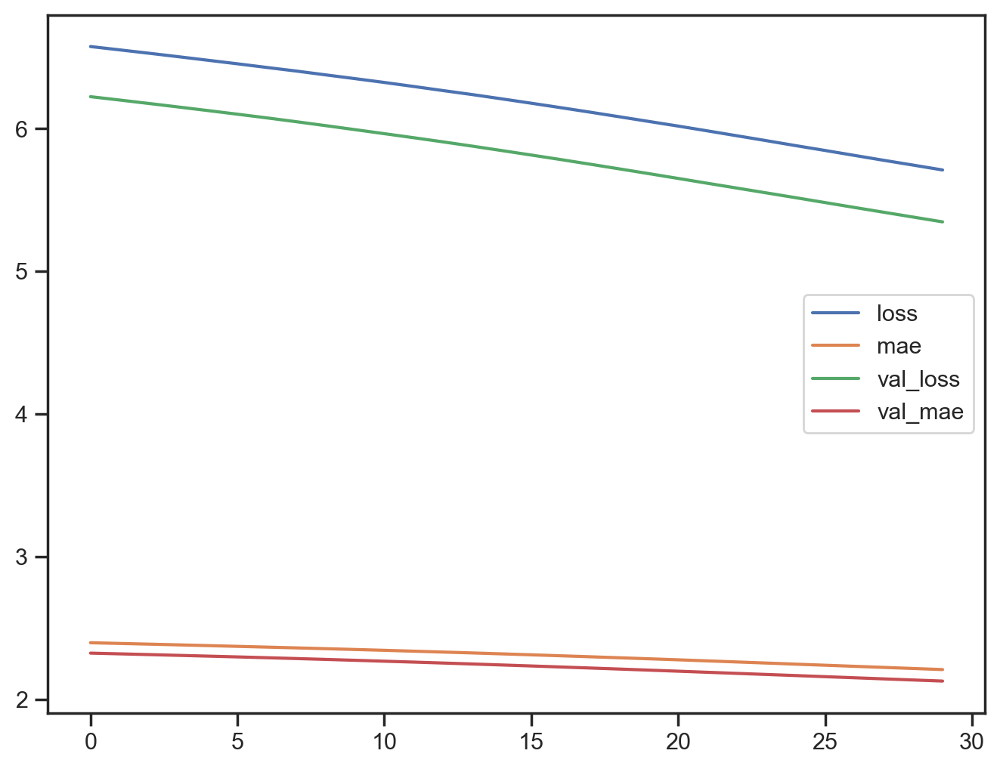

In [102]:
pd.DataFrame(history.history).plot(figsize=(8,6))

10/10 [==============================] - 0s 3ms/step


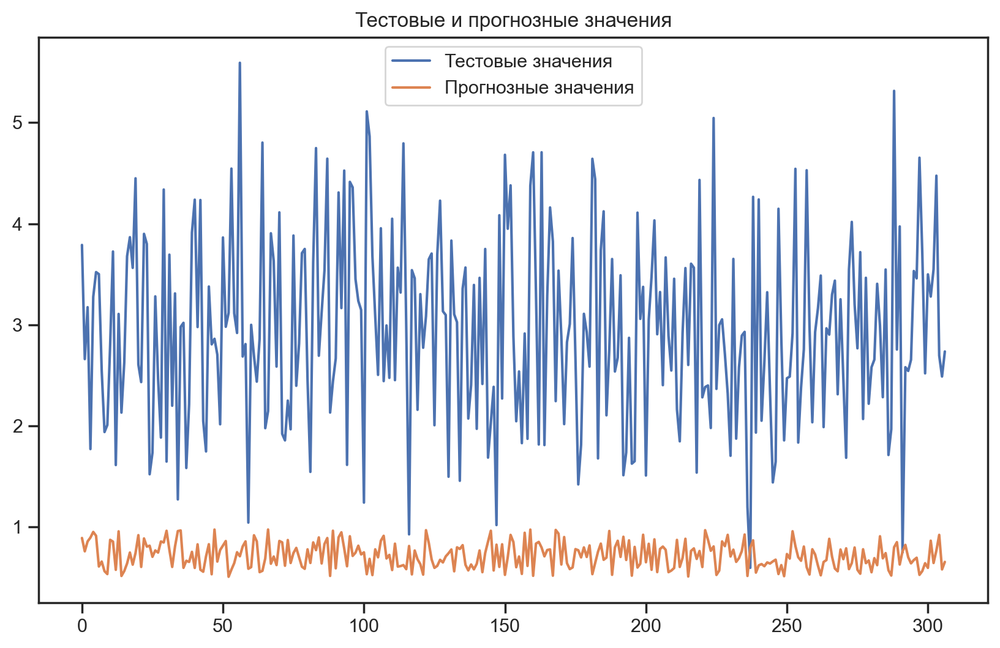

In [104]:
# Предсказание на тестовой выборке
y_pred = model.predict(x_test)

# Тестовые и прогнозные значения
plt.figure(figsize=(10,6))
plt.plot(y_test, label='Тестовые значения')
plt.plot(y_pred, label='Прогнозные значения')
#plt.xlabel('Samples')
#plt.ylabel('Соотношение матрица-наполнитель')
plt.title('Тестовые и прогнозные значения')
plt.legend()
plt.show()

In [110]:
y_pred

array([[0.891941  ],
       [0.76001805],
       [0.85789925],
       [0.89593965],
       [0.95180786],
       [0.91388285],
       [0.60978824],
       [0.65899086],
       [0.563592  ],
       [0.5350276 ],
       [0.8735973 ],
       [0.8561954 ],
       [0.5770883 ],
       [0.9577195 ],
       [0.51635313],
       [0.5652125 ],
       [0.63950205],
       [0.7481899 ],
       [0.62797266],
       [0.7436343 ],
       [0.9199427 ],
       [0.60574406],
       [0.8873334 ],
       [0.80661607],
       [0.81560314],
       [0.70592314],
       [0.768964  ],
       [0.7474728 ],
       [0.85723585],
       [0.8477238 ],
       [0.96317387],
       [0.7748516 ],
       [0.60574406],
       [0.808168  ],
       [0.96045   ],
       [0.9662927 ],
       [0.59684616],
       [0.6666829 ],
       [0.6551307 ],
       [0.75494546],
       [0.59579134],
       [0.8292397 ],
       [0.5782171 ],
       [0.5579825 ],
       [0.71073323],
       [0.8302499 ],
       [0.53314793],
       [0.975

## Приложение

In [112]:
import pickle

# Сохраняем модель для приложения
with open("model.pkl", "wb") as f:
    pickle.dump(model, f)
    
# Код для загрузки модели
with open("model.pkl", "rb") as f:
    loaded_model = pickle.load(f)

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........2
.........3
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                                    2023-04-23 22:34:06         2085
metadata.json                                  2023-04-23 22:34:06           64
variables.h5                                   2023-04-23 22:34:06        26904
Keras model archive loading:
File Name                                             Modified             Size
co

In [115]:
pip freeze > requirements_main_file.txt

Note: you may need to restart the kernel to use updated packages.
